In [1]:
#

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [3]:
# Load Bus data #

df = pd.read_parquet('bus478.parquet')
print('Timespan Bus 478:' , df.index.min(), 'to', df.index.max(), '\n')
print('Bus 478:' , df['sys_phase'].value_counts().sort_index())

Timespan Bus 478: 2025-12-01 00:00:00 to 2026-02-28 05:19:00 

Bus 478: sys_phase
1.0      118
2.0      343
3.0      288
4.0       82
5.0    26826
6.0     9688
7.0       70
Name: count, dtype: int64


In [4]:
# Identify numerical and categorical features #

categorical = ['sys_phase',
               'aux_wp',
               'trac_wp',
               'dcdc1_inv_stat',
               'dcdc2_inv_stat',
               'dcac3_inv_stat']

numerical = ['gfd_res',
             'bat_soc',
             'aux_cw_temp',
             'aux_hw_temp',
             'trac_cw_temp',
             'trac_hw_temp',
             'aircomp_speed',
             'aircomp_temp',
             'dcdc1_power',
             'dcdc1_temp',
             'dcdc2_power',
             'dcdc2_temp',
             'dcac3_power',
             'dcac3_temp']

states = {1.0: 'Wake-Up',
          2.0: 'Ignition',
          3.0: 'Running Request',
          4.0: 'Running',
          5.0: 'Moving',
          6.0: 'Power Down',
          7.0: 'Charging'}


In [5]:
# Correct categorical features data type #

for var in categorical:
    
    df[var] = df[var].astype('category')

# Add absent category on dcac3_inv_stat
    
df['dcac3_inv_stat'] = df['dcac3_inv_stat'].cat.add_categories(1.0).cat.reorder_categories([0.0,1.0,3.0], ordered=True)



In [6]:
def plot_num(df, numfeat, n=0, rsmpl=''):
    """
    Plot time series
    """
    plt.figure(figsize=(20, 12))   
    df[numfeat].resample(rsmpl).mean().plot() if rsmpl else df[numfeat].plot() 
 
    plt.xlabel("Date")
    plt.ylabel("Units")
    plt.title(f'{numfeat}', fontsize=34)
    plt.grid(True)
    plt.show()


def plot_numbycat(df, numfeat, catfeat):
    """
    Plot time series with categorical highlighting
    """

    fig, ax = plt.subplots(figsize=(20, 12))
    ax.plot(df.index, df[numfeat], color='black', linewidth=1.5, label='Signal')
    
    # Highlighting States
    colors = {1.0: "grey", 2.0: "green", 3.0: "red", 4.0: "purple", 5.0: "blue", 6.0: "orange", 7.0: "yellow"}

    
    # Find the indices where the phase changes
    change_indices = df.index[df[catfeat] != df[catfeat].shift()].tolist()
 
    # Append the very end of the dataframe to close the last span
    change_indices.append(df.index[-1])
    
    # Loop through the change points and draw spans
    for i in range(len(change_indices) - 1):
        start_time = change_indices[i]
        end_time = change_indices[i+1]
        
        # Get the state value at the start of this block
        state = df.loc[start_time, catfeat]
        
        # Fallback color if state isn't in your dict (e.g., NaN values)
        span_color = colors.get(state, "white") 
        
        ax.axvspan(start_time, end_time, color=span_color, alpha=0.3, label=str(state))
        
        # Clean up and Order Legend
        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        
        # Separate the 'Signal' line from the state highlights so 'Signal' stays at the top
        signal_handle = by_label.pop('Signal', None)
        
        # Sort the remaining state keys numerically/alphabetically
        sorted_state_labels = sorted(by_label.keys(), key=float)

    # Rebuild the handles and labels in the desired order
    ordered_labels = []
    ordered_handles = []

    # Put Signal first if it exists
    if signal_handle:
        ordered_labels.append('Signal')
        ordered_handles.append(signal_handle)
        
        # Add the sorted states
        for label in sorted_state_labels:
            ordered_labels.append(f"State {label[0]}")
            ordered_handles.append(by_label[label])
            
            # Apply to the legend
            ax.legend(ordered_handles, ordered_labels, loc='lower right')

    plt.title(f"{numfeat} with {catfeat} states highlights", fontsize=34)
    plt.xlabel("time")
    plt.ylabel(numfeat)
    plt.show()

In [7]:

def get_missing_periods(df, feature_name, n=10):
    """
    Identifies periods of missing values in a minute-indexed dataframe. 
    """
    
    # 1. Ensure the dataframe is sorted by time
    df = df.sort_index()
    
    # 2. Create a boolean mask of where the feature is missing
    is_missing = df[feature_name].isnull()
    
    # 3. Create a group ID that increments every time the status changes 
    # (e.g., from present to missing, or missing to present).
    # This groups contiguous blocks of data together.
    group_id = (is_missing != is_missing.shift()).cumsum()
    
    # 4. Filter only the missing data and group it by our new group_id
    missing_groups = df[is_missing].groupby(group_id)
    
    # 5. Calculate start, end, and duration for each missing block
    periods = missing_groups.apply(
        lambda x: pd.Series({
            'start_time': x.index.min().strftime('Day %d %H:%M'),
            'end_time': x.index.max().strftime('Day %d %H:%M'),
            'duration_hours': round(len(x)/60) # len() works because the sampling rate is 1 minute
        })
    )
    
    # 6. Sort by duration descending and clean up the index
    if not periods.empty:
        periods = periods.sort_values(by='duration_hours', ascending=False).reset_index(drop=True)
    else:
        # Return an empty dataframe with the correct columns if there are no NaNs
        periods = pd.DataFrame(columns=['start_time', 'end_time', 'duration_hours'])
        
    return periods.head(n)


def get_complete_missing_periods(df):
    """
    Identifies periods where ALL features are missing in a time-indexed dataframe.
    """
    # 1. Ensure the dataframe is sorted chronologically
    df = df.sort_index()
    
    # 2. Create a boolean mask where ALL columns in a row are NaN
    is_missing_all = df.isna().all(axis=1)
    
    # 3. Create a group ID for contiguous blocks
    group_id = (is_missing_all != is_missing_all.shift()).cumsum()
    
    # 4. Filter to keep only the completely missing rows, then group
    missing_groups = df[is_missing_all].groupby(group_id)
    
    # 5. Calculate start, end, and duration for each block
    periods = missing_groups.apply(
        lambda x: pd.Series({
            'start_time': x.index.min(),
            'end_time': x.index.max(),
            # Using row count as the primary duration metric, assuming a uniform sampling rate
            'missing_row_count': len(x),
            # Timedelta represents the time elapsed between the first and last missing row
            'time_elapsed': x.index.max() - x.index.min() 
        })
    )
    
    # 6. Sort by duration (row count) descending and clean the index
    if not periods.empty:
        periods = periods.sort_values(by='missing_row_count', ascending=False).reset_index(drop=True)
    else:
        # Return an empty dataframe with correct columns if no missing periods exist
        periods = pd.DataFrame(columns=['start_time', 'end_time', 'missing_row_count', 'time_elapsed'])
        
    return periods

In [8]:
# Descriptive statistics #

for var in numerical:

    print(df[var].describe())

    
for var in categorical: 
    
    print(df[var].value_counts().sort_index(), '\n')  

count    54744.000000
mean      1956.917969
std       7436.939941
min          0.000000
25%        696.000000
50%        703.818176
75%        714.833313
max      54833.000000
Name: gfd_res, dtype: float64
count    61377.000000
mean        60.761444
std          6.245574
min         13.599999
25%         56.166668
50%         61.599995
75%         65.566666
max         74.800003
Name: bat_soc, dtype: float64
count    53957.000000
mean        42.377003
std          9.677645
min        -40.000000
25%         42.192307
50%         46.432434
75%         47.160000
max         48.538460
Name: aux_cw_temp, dtype: float64
count    53804.000000
mean        43.228481
std          9.854205
min        -40.000000
25%         43.048492
50%         47.375000
75%         48.000000
max         50.000000
Name: aux_hw_temp, dtype: float64
count    54258.000000
mean        44.667091
std          9.663089
min        -40.000000
25%         46.930233
50%         47.744434
75%         48.181820
max         49

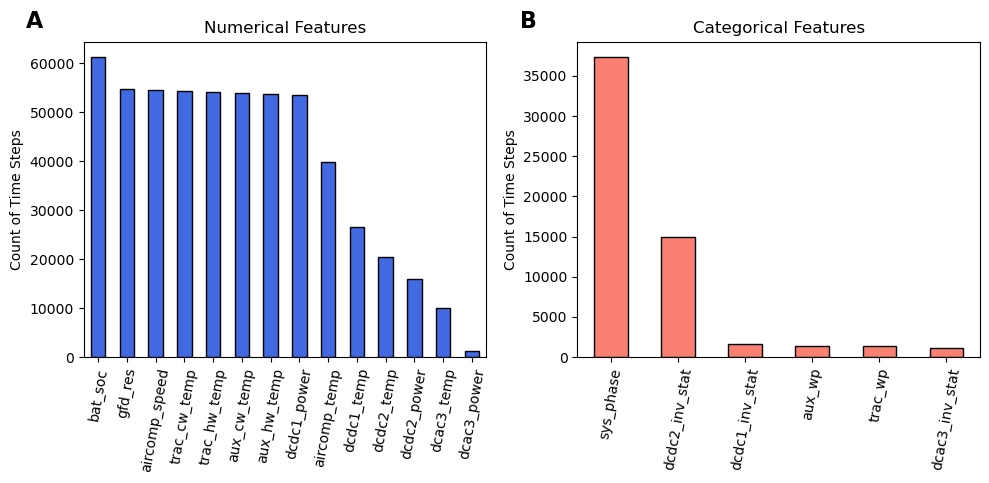

In [9]:
# Plot available Time STEPS


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Numerical

df[numerical].count().sort_values(ascending=False).plot(kind='bar', ax=ax1, color='royalblue', edgecolor='black')

ax1.set_title('Numerical Features')
#ax1.set_xlabel('Features')
ax1.set_ylabel('Count of Time Steps')

# Categorical

df[categorical].count().sort_values(ascending=False).plot(kind='bar', ax=ax2,color='salmon', edgecolor='black')
ax2.set_title('Categorical Features')
#ax2.set_xlabel('Features')
ax2.set_ylabel('Count of Time Steps')

# Rotate tick labels

for ax in [ax1, ax2]:
    ax.tick_params(axis='x', rotation=80)
    
# Define subplot labels and axes for a loop

axes = [ax1, ax2]
labels = ['A', 'B']

for i, ax in enumerate(axes):

    ax.text(-0.1, 1.1, labels[i], transform=ax.transAxes, 
            fontsize=16, fontweight='bold', va='top', ha='right')    
    
plt.tight_layout()
#plt.savefig('raw_time_steps.png')   
plt.show()

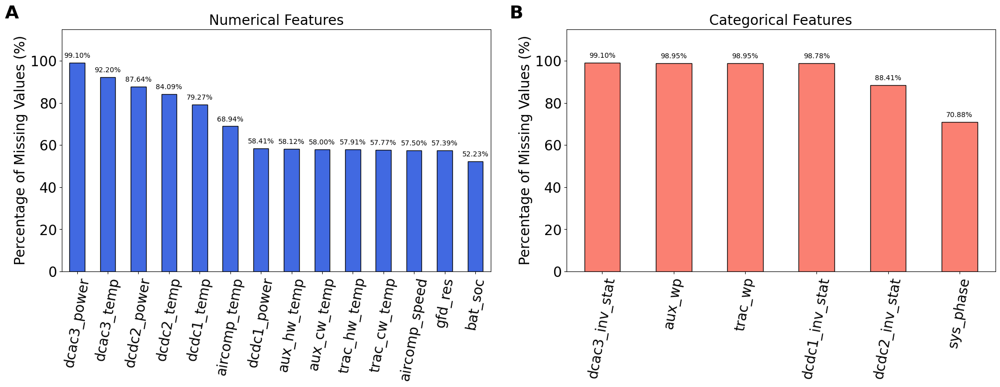

In [10]:

# Plot Missing Values Percentage by feature

# Create a figure with 1 row and 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# --- Subplot 1: Group 1 ---
missing_pct_1 = (df[numerical].isnull().sum() / len(df)) * 100
missing_pct_1 = missing_pct_1.sort_values(ascending=False)
bars1 = missing_pct_1.plot(kind='bar', ax=ax1, color='royalblue', edgecolor='black')

# Add labels on top of bars
ax1.bar_label(ax1.containers[0], fmt='%.2f%%', padding=5)
ax1.set_title('Numerical Features', fontsize=20)
ax1.set_ylabel('Percentage of Missing Values (%)', fontsize=20)
ax1.set_ylim(0, 115) # Increased limit to make room for text labels
ax1.tick_params(axis='both', labelsize=20)

# --- Subplot 2: Group 2 ---
missing_pct_2 = (df[categorical].isnull().sum() / len(df)) * 100
missing_pct_2 = missing_pct_2.sort_values(ascending=False)
bars2 = missing_pct_2.plot(kind='bar', ax=ax2, color='salmon', edgecolor='black')

# Add labels on top of bars
ax2.bar_label(ax2.containers[0], fmt='%.2f%%', padding=5)
ax2.set_title('Categorical Features', fontsize=20)
ax2.set_ylabel('Percentage of Missing Values (%)', fontsize=20)
ax2.tick_params(axis='both', labelsize=20)
ax2.set_ylim(0, 115)

# Rotate tick labels

for ax in [ax1, ax2]:
    ax.tick_params(axis='x', rotation=80)

# Define subplot labels and axes for a loop

axes = [ax1, ax2]
labels = ['A', '   B']

for i, ax in enumerate(axes):

    ax.text(-0.1, 1.1, labels[i], transform=ax.transAxes, 
            fontsize=26, fontweight='bold', va='top', ha='right')    

plt.tight_layout()
plt.show()

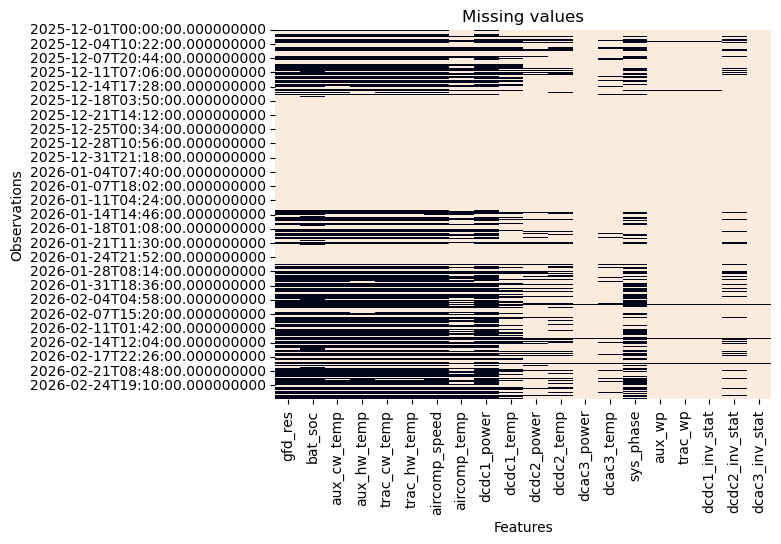

In [11]:
# Missing values heatmap

sns.heatmap(df.isnull(), cbar=False)

plt.title('Missing values')
plt.xlabel('Features')
plt.ylabel('Observations')
plt.show()

In [12]:
# identify periods without any data for more than 1 day

print(get_complete_missing_periods(df)[get_complete_missing_periods(df).missing_row_count > 1440])


# remove periods with missing values in all features #

df.dropna(how='all', inplace=True)

           start_time            end_time  missing_row_count     time_elapsed
0 2025-12-20 03:25:00 2025-12-30 13:23:00              14999 10 days 09:58:00
1 2025-12-30 16:40:00 2026-01-08 05:56:00              12317  8 days 13:16:00
2 2026-01-09 07:57:00 2026-01-13 09:52:00               5876  4 days 01:55:00
3 2026-01-23 12:04:00 2026-01-26 05:20:00               3917  2 days 17:16:00
4 2025-12-17 10:48:00 2025-12-20 02:45:00               3838  2 days 15:57:00
5 2026-01-08 06:19:00 2026-01-09 07:13:00               1495  1 days 00:54:00


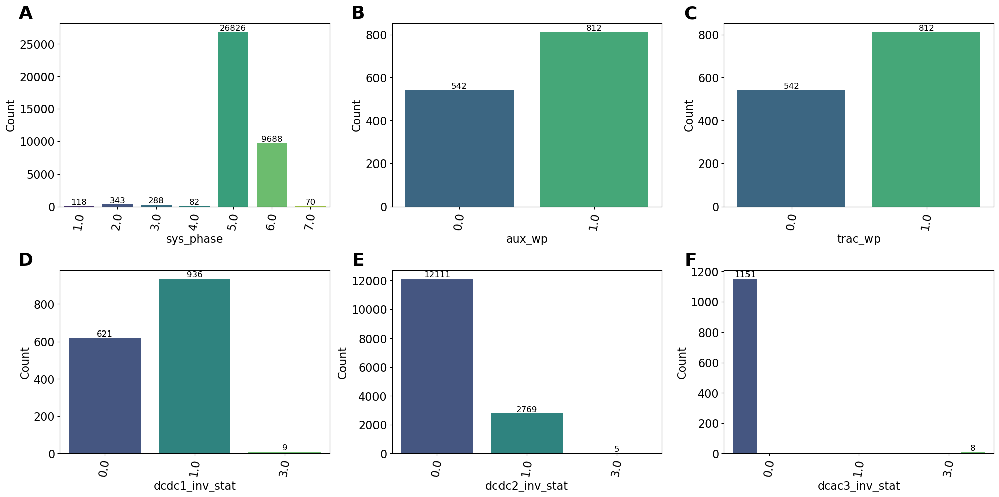

In [13]:
# Count plots for categorical 

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))
axes = axes.flatten()

for i, col in enumerate(categorical):
    sns.countplot(data=df, x=col, ax=axes[i], palette='viridis', hue=col, legend=False)
#    axes[i].set_title('Count of {}'.format(col), fontweight='bold',fontsize=16)
    axes[i].tick_params(axis='x', rotation=80)
    axes[i].tick_params(axis='both', labelsize=16)
    axes[i].set_ylabel('Count', fontsize=16)
    axes[i].set_xlabel(col, fontsize=16)
    
    # Add the count labels on top of the bars
    for container in axes[i].containers:
        axes[i].bar_label(container, fontsize=12)


labels = ['A', 'B', 'C', 'D', 'E', 'F']

for i, ax in enumerate(axes):

    ax.text(-0.1, 1.1, labels[i], transform=ax.transAxes, 
            fontsize=26, fontweight='bold', va='top', ha='right')    

plt.tight_layout()
plt.show()

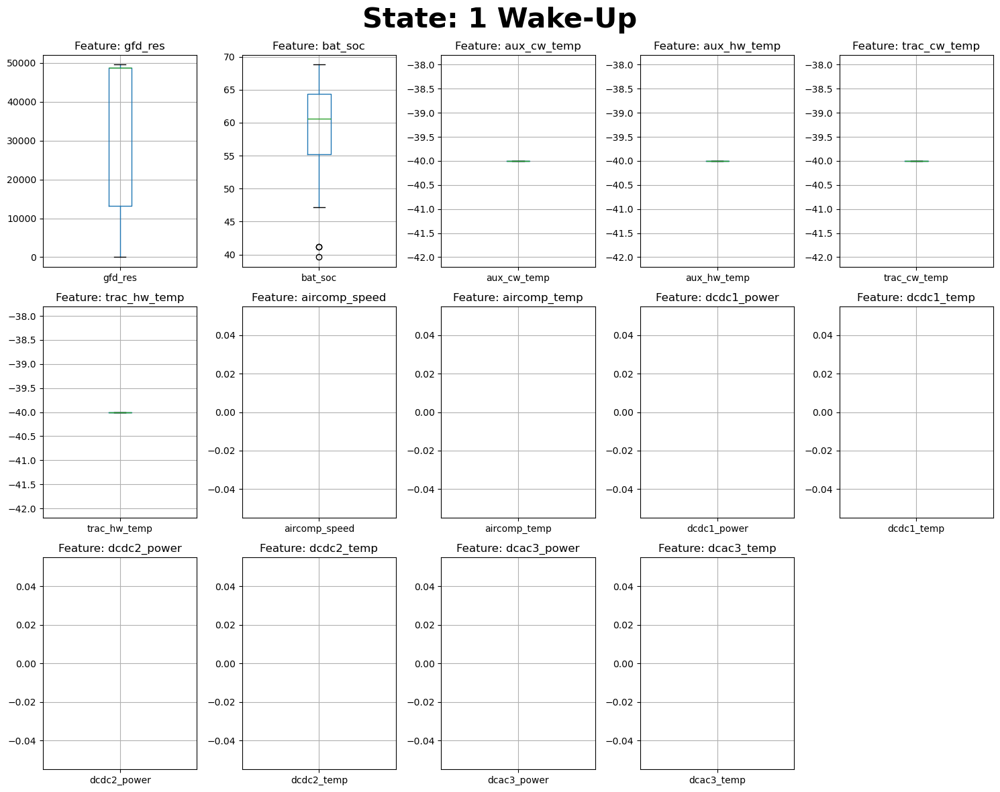

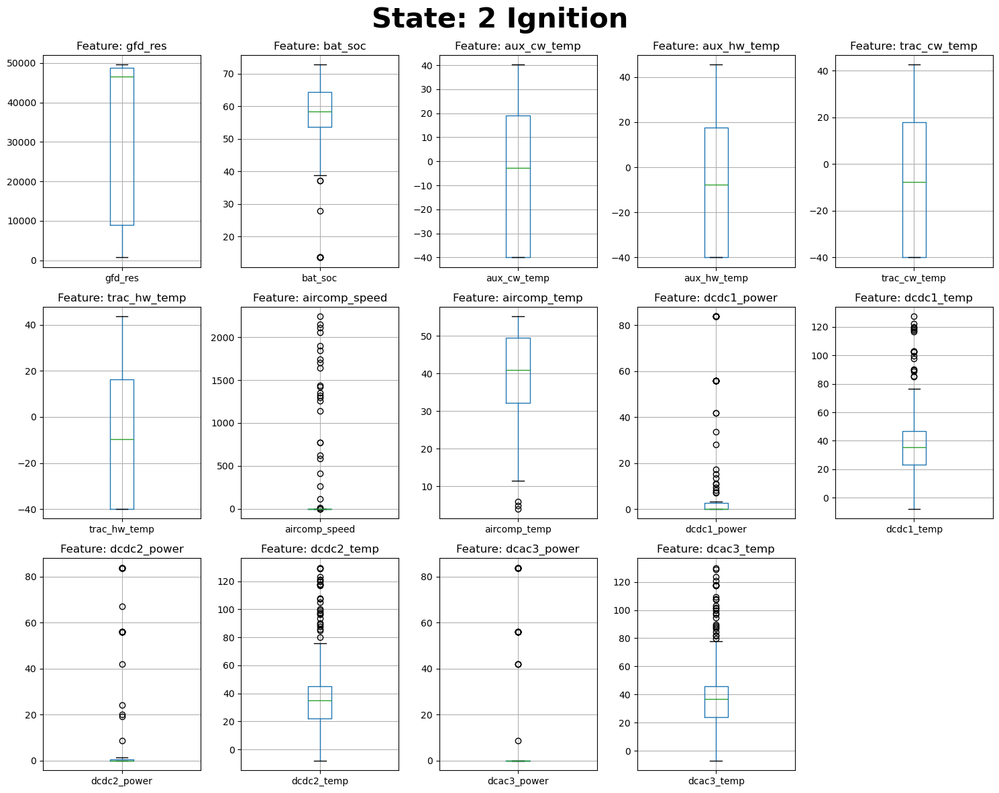

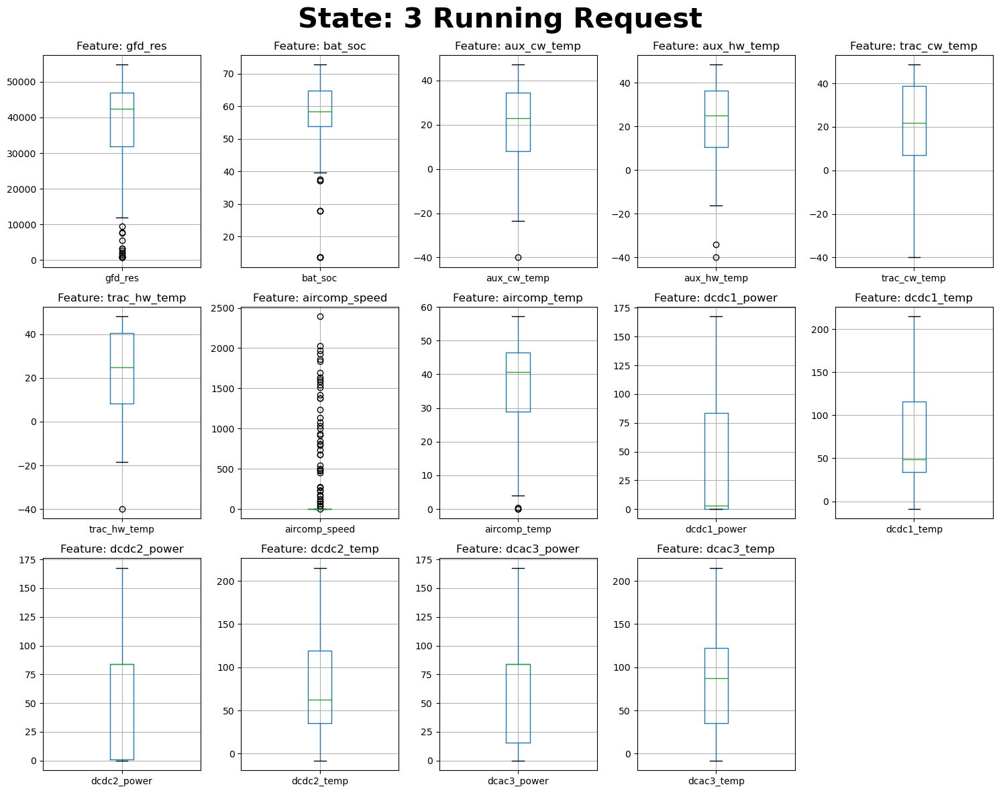

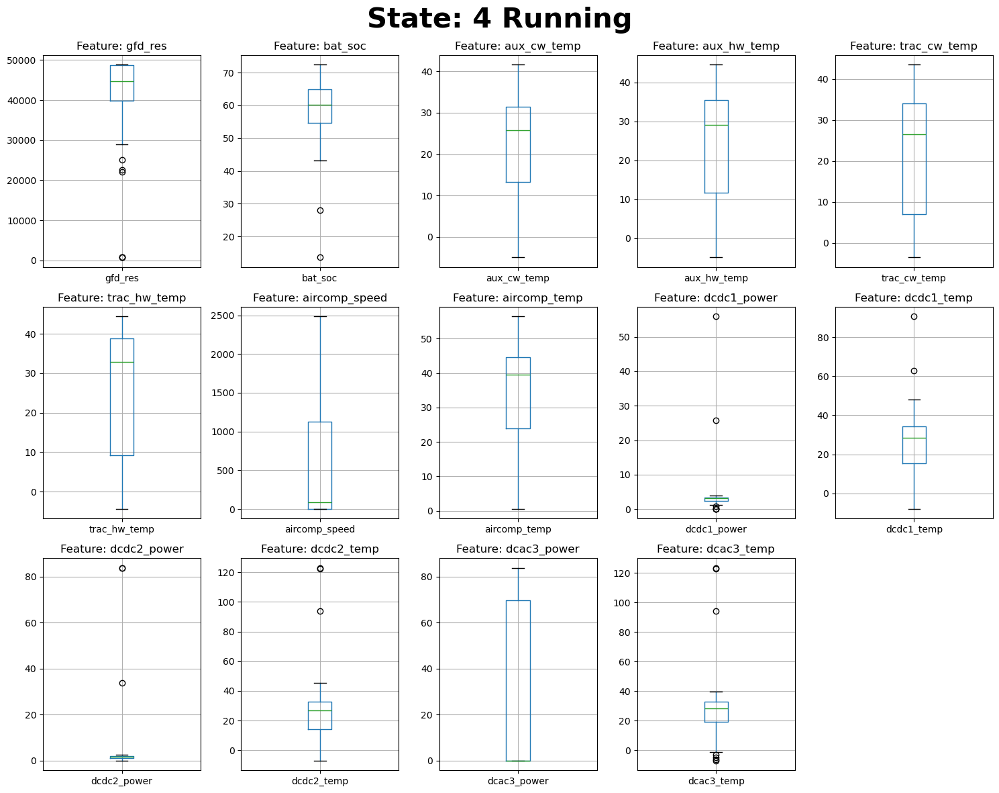

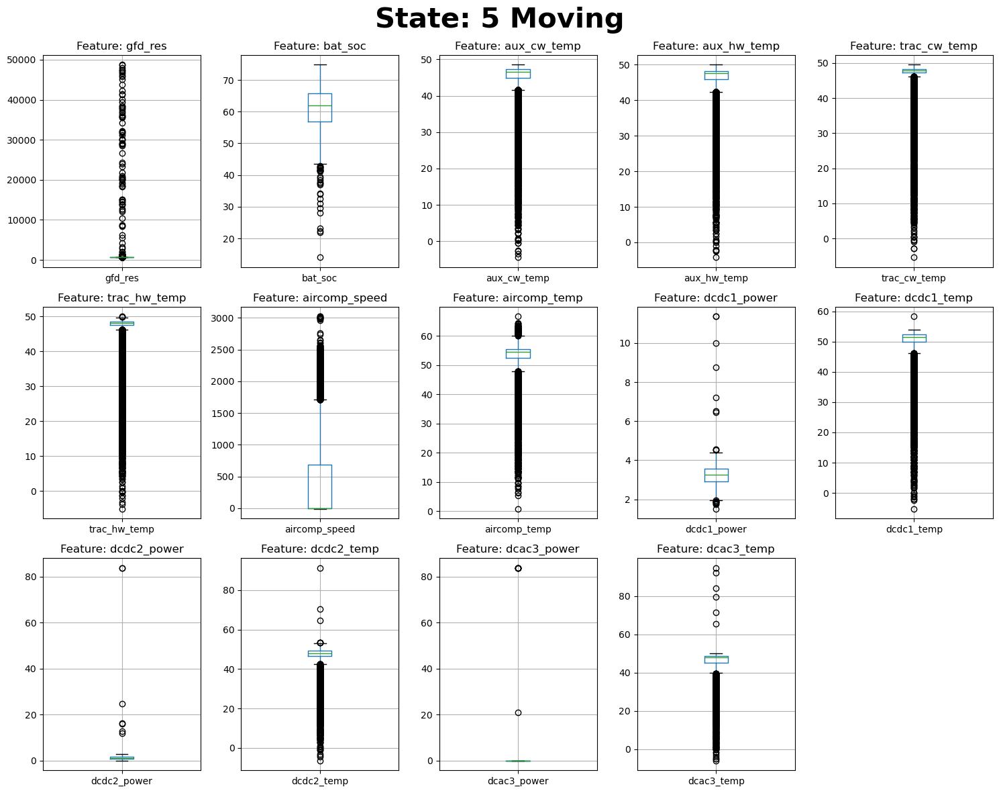

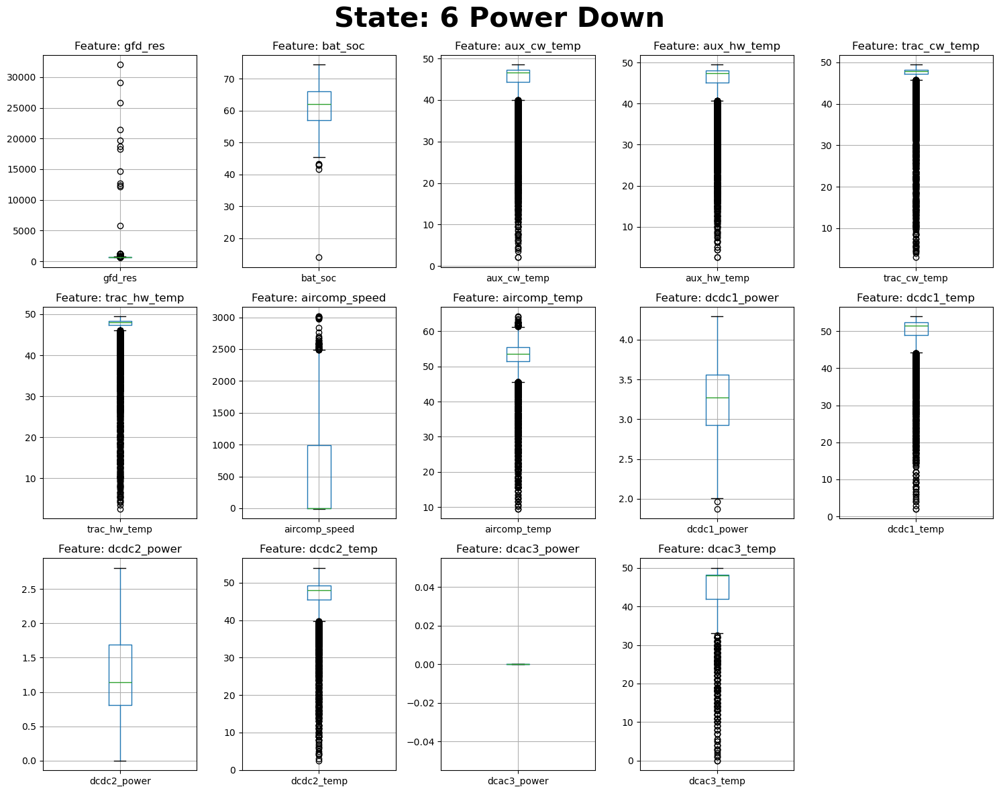

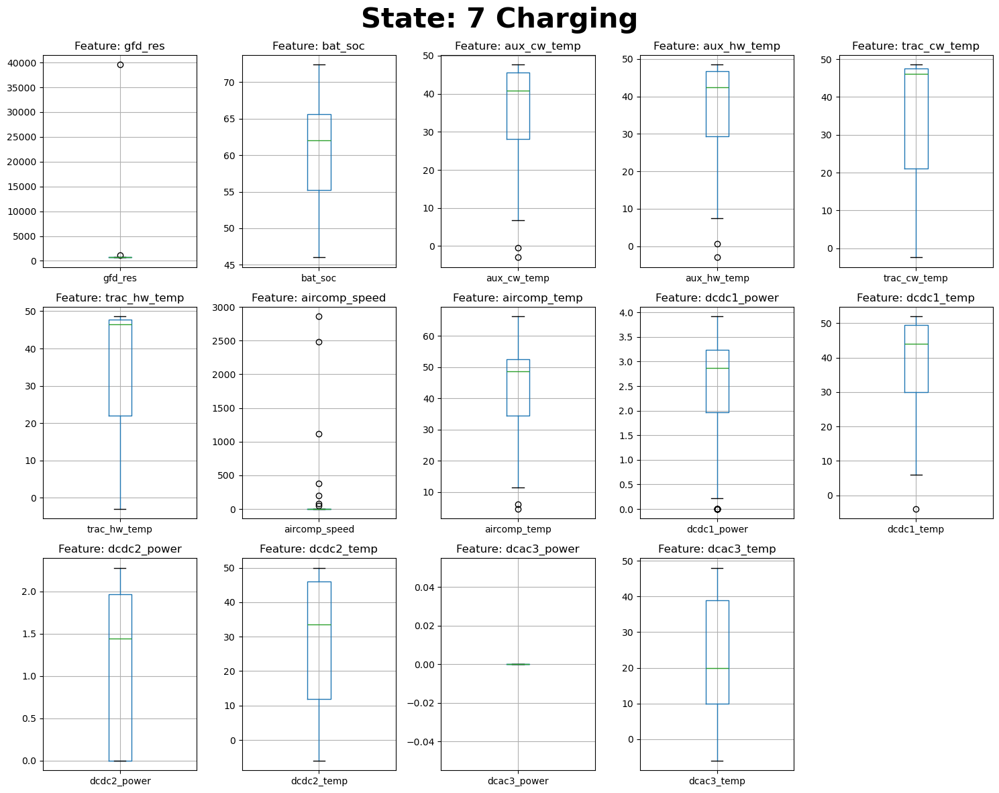

In [14]:
# Boxplots for numerical in different states


for state in range(1, 8):

    numerical_cols = df[numerical].columns
    num_features = len(numerical_cols)
    cols = 5
    rows = math.ceil(num_features / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
    axes = axes.flatten() 

    fig.suptitle(f'State: {state} {states[state]}', fontsize=30, fontweight='bold', y=0.98)
    
    for i, col_name in enumerate(numerical_cols):
        df[df['sys_phase'] == float(state)].boxplot(column=col_name, ax=axes[i])
        axes[i].set_title(f'Feature: {col_name}', fontsize=12)

    for j in range(num_features, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()

    fig.subplots_adjust(top=0.92) 

    plt.show()

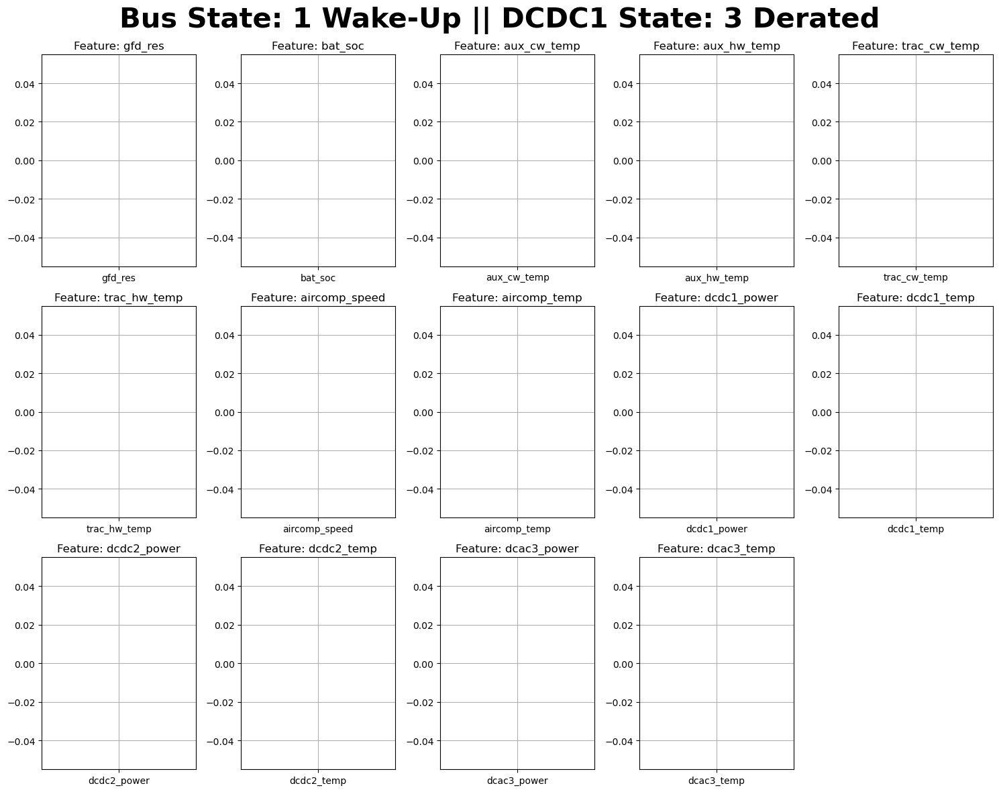

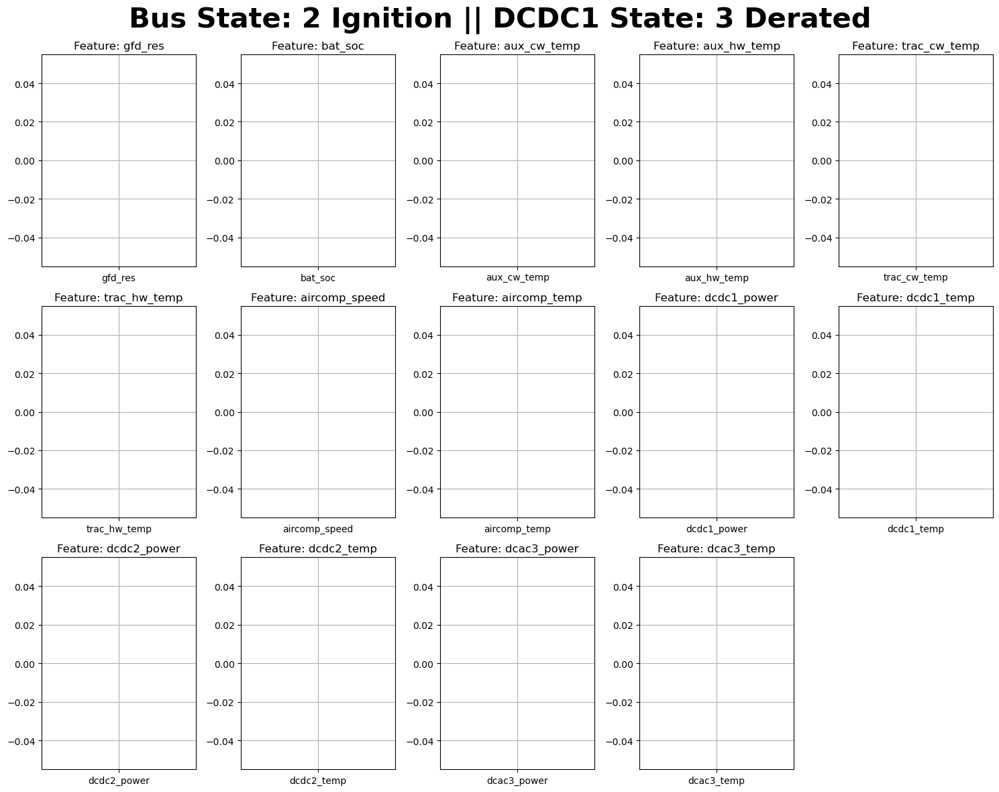

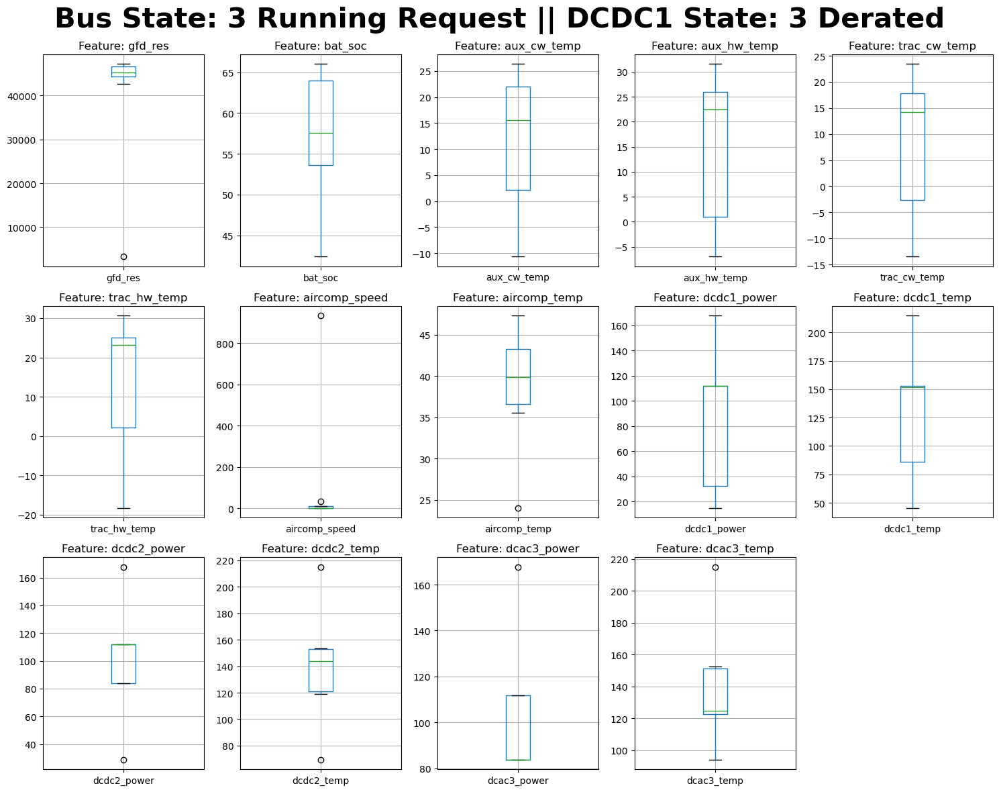

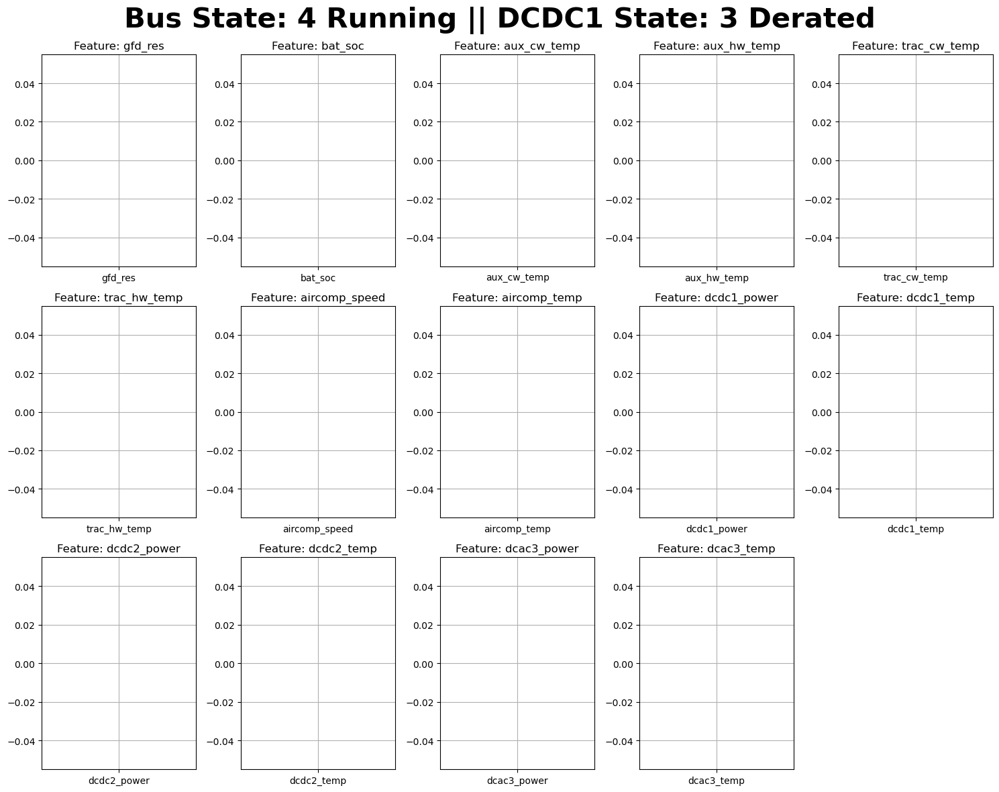

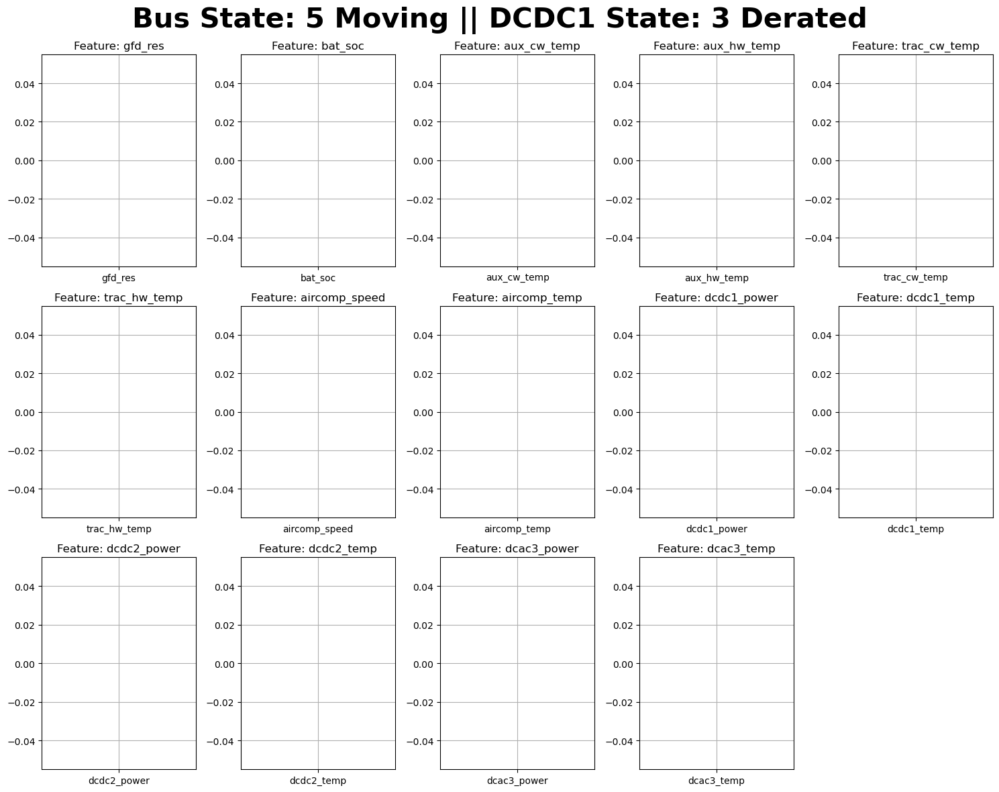

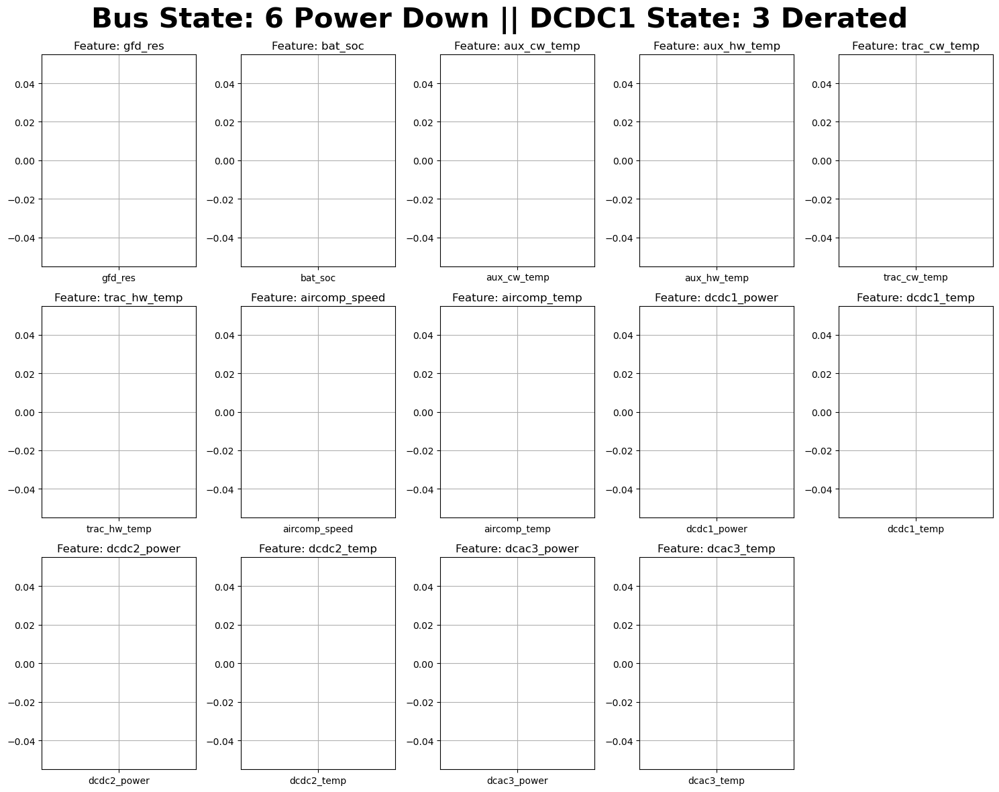

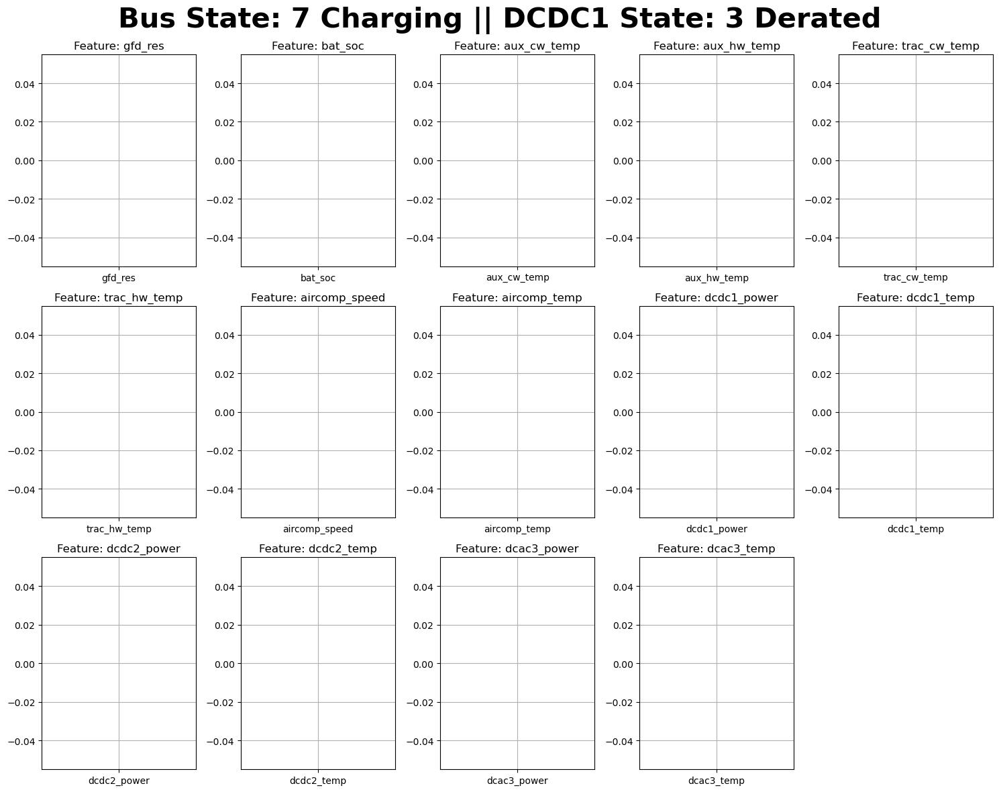

In [15]:
# Boxplots for numerical in different states and with DCDC1 inv stat in derated 3.0

# DCDC2 e DCAC3 com o mesmo padrão em Running Request


for state in range(1, 8):

    numerical_cols = df[numerical].columns
    num_features = len(numerical_cols)
    cols = 5
    rows = math.ceil(num_features / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4))
    axes = axes.flatten() 

    fig.suptitle(f'Bus State: {state} {states[state]} || DCDC1 State: 3 Derated', fontsize=30, fontweight='bold', y=0.98)
    
    for i, col_name in enumerate(numerical_cols):
        df[(df['sys_phase'] == float(state)) & (df['dcdc1_inv_stat'] == 3.0)].boxplot(column=col_name, ax=axes[i])
        axes[i].set_title(f'Feature: {col_name}', fontsize=12)

    for j in range(num_features, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()

    fig.subplots_adjust(top=0.92) 

    plt.show()

In [16]:
print(df[df["dcdc1_inv_stat"] == 0]["sys_phase"].value_counts().sort_index())
print(df[df["dcdc1_inv_stat"] == 1]["sys_phase"].value_counts().sort_index())
print(df[df["dcdc1_inv_stat"] == 3]["sys_phase"].value_counts().sort_index())

print(df[df["dcdc2_inv_stat"] == 0]["sys_phase"].value_counts().sort_index())
print(df[df["dcdc2_inv_stat"] == 1]["sys_phase"].value_counts().sort_index())
print(df[df["dcdc2_inv_stat"] == 3]["sys_phase"].value_counts().sort_index())

print(df[df["dcac3_inv_stat"] == 0]["sys_phase"].value_counts().sort_index())
print(df[df["dcac3_inv_stat"] == 1]["sys_phase"].value_counts().sort_index())
print(df[df["dcac3_inv_stat"] == 3]["sys_phase"].value_counts().sort_index())

sys_phase
1.0      0
2.0    207
3.0    247
4.0     12
5.0     76
6.0      1
7.0     65
Name: count, dtype: int64
sys_phase
1.0      0
2.0      2
3.0     13
4.0     55
5.0    557
6.0    299
7.0      1
Name: count, dtype: int64
sys_phase
1.0    0
2.0    0
3.0    9
4.0    0
5.0    0
6.0    0
7.0    0
Name: count, dtype: int64
sys_phase
1.0       0
2.0     168
3.0     169
4.0      19
5.0    6882
6.0    3462
7.0      21
Name: count, dtype: int64
sys_phase
1.0       0
2.0       0
3.0       2
4.0      21
5.0    1595
6.0     752
7.0       1
Name: count, dtype: int64
sys_phase
1.0    0
2.0    0
3.0    5
4.0    0
5.0    0
6.0    0
7.0    0
Name: count, dtype: int64
sys_phase
1.0      0
2.0    151
3.0    159
4.0      7
5.0    511
6.0    296
7.0      9
Name: count, dtype: int64
sys_phase
1.0    0
2.0    0
3.0    0
4.0    0
5.0    0
6.0    0
7.0    0
Name: count, dtype: int64
sys_phase
1.0    0
2.0    0
3.0    8
4.0    0
5.0    0
6.0    0
7.0    0
Name: count, dtype: int64


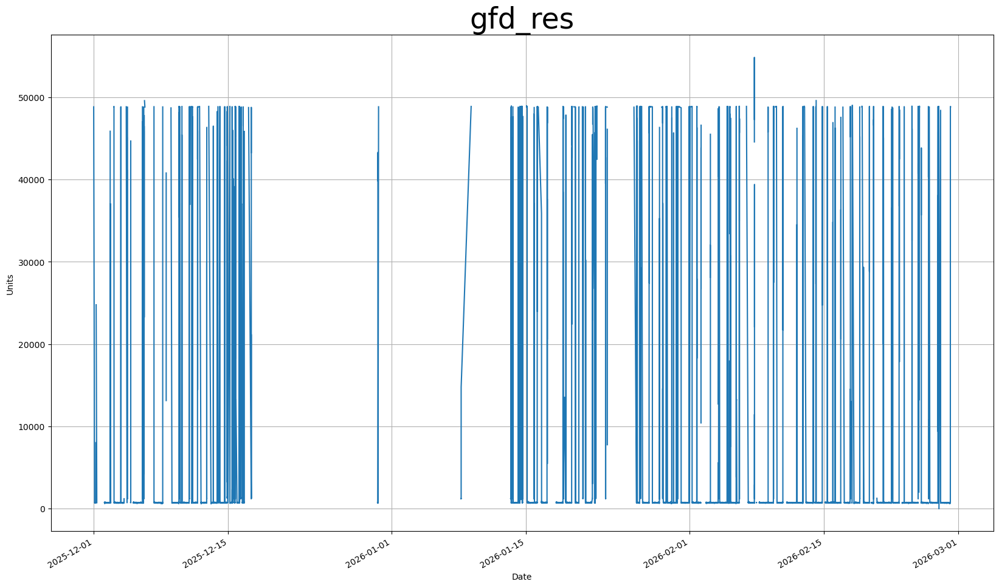

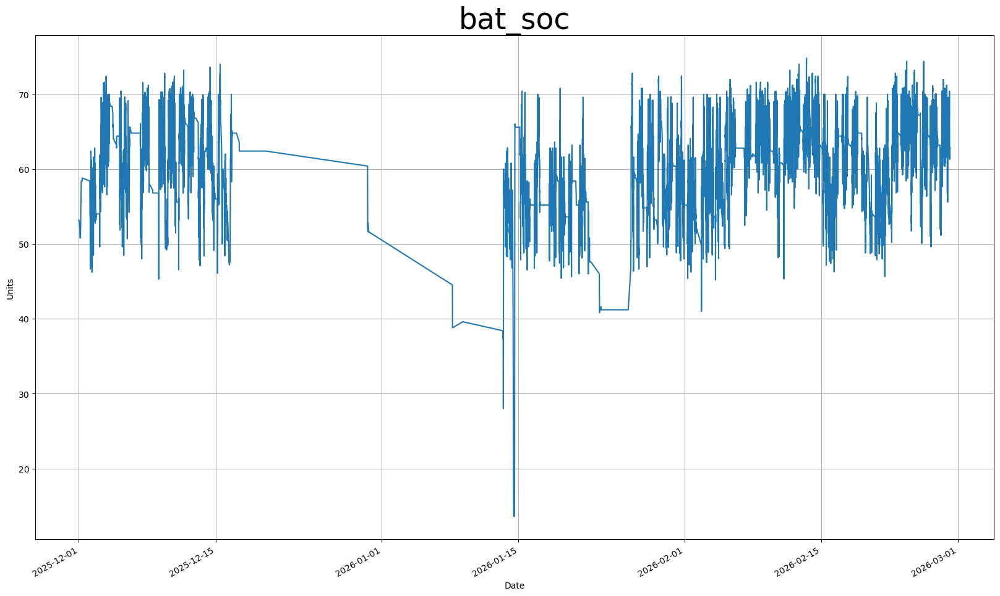

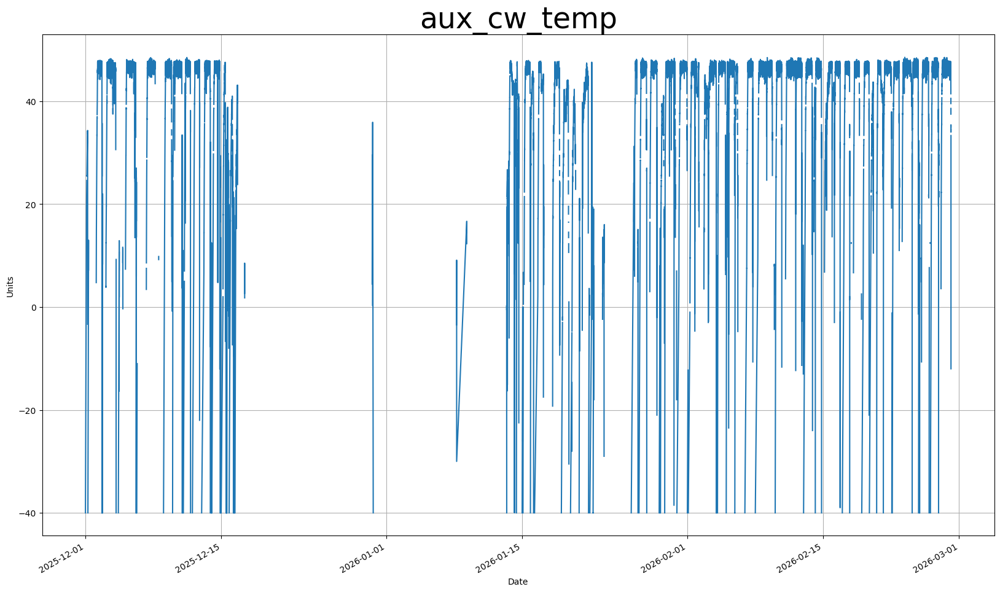

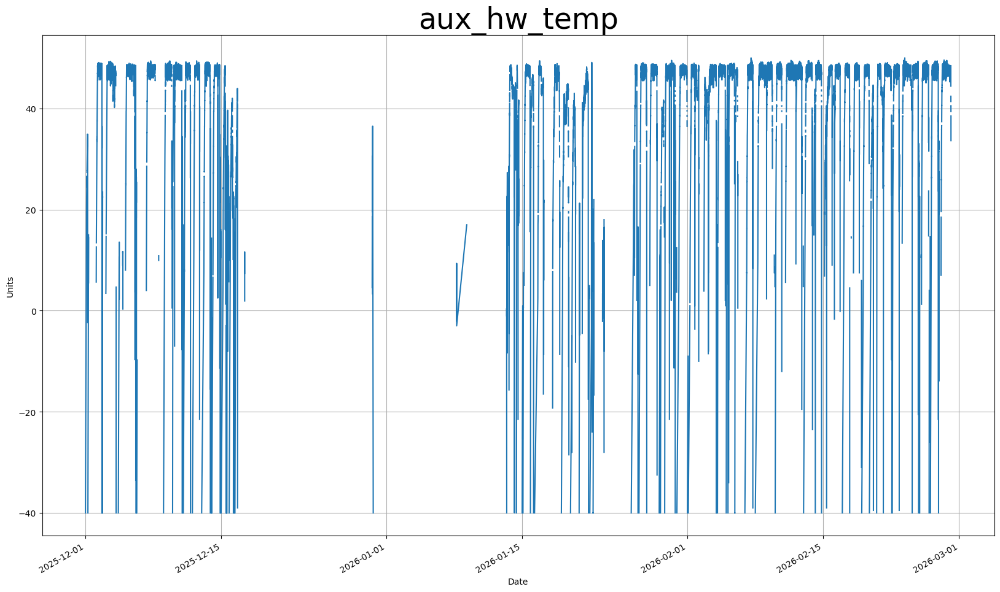

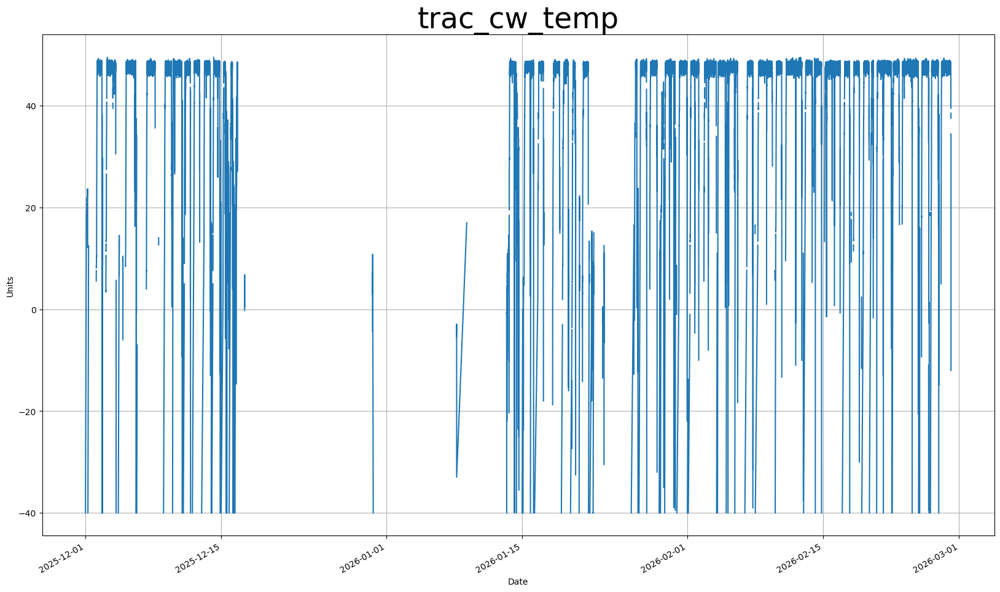

...

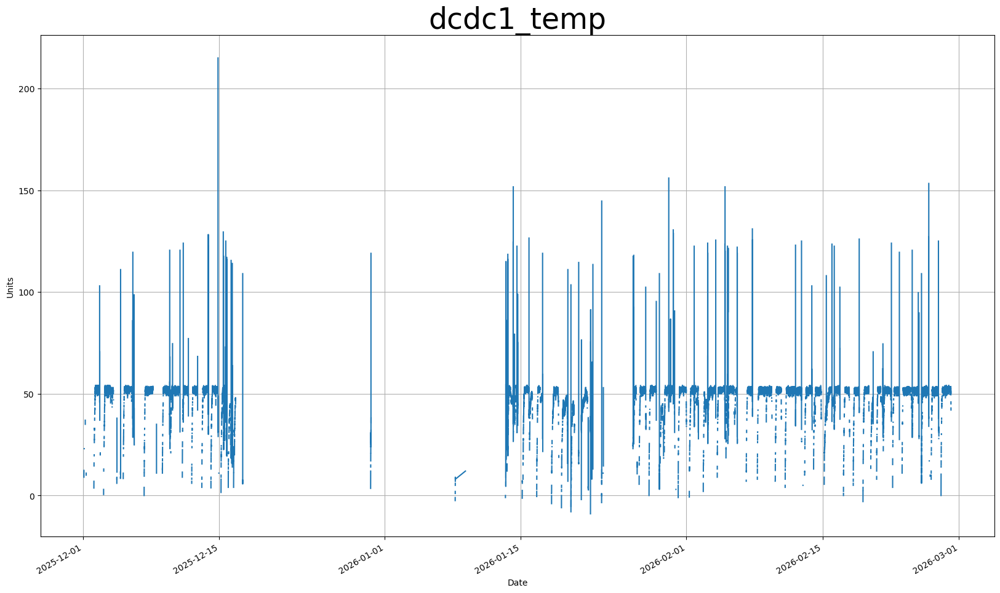

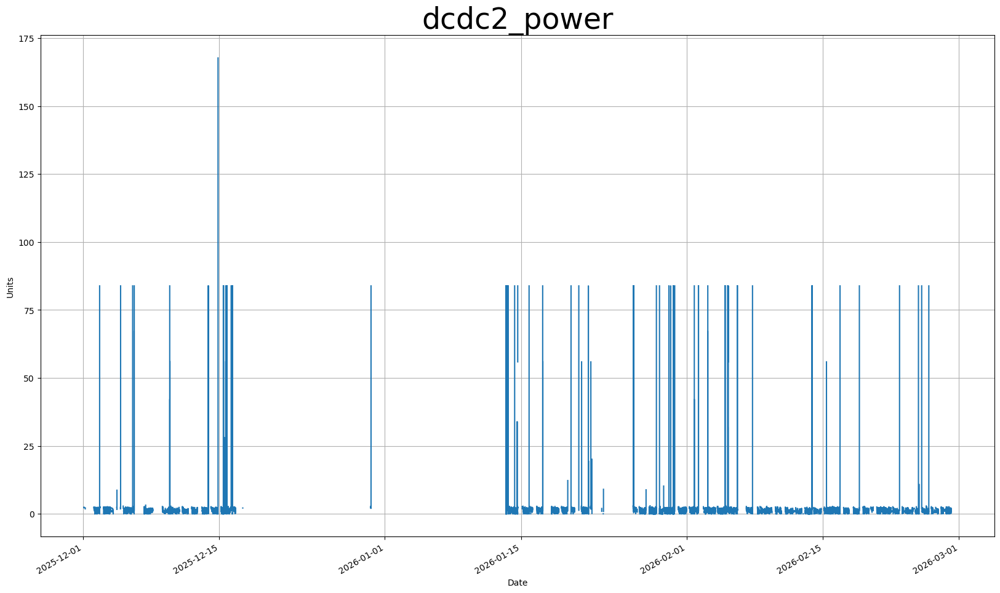

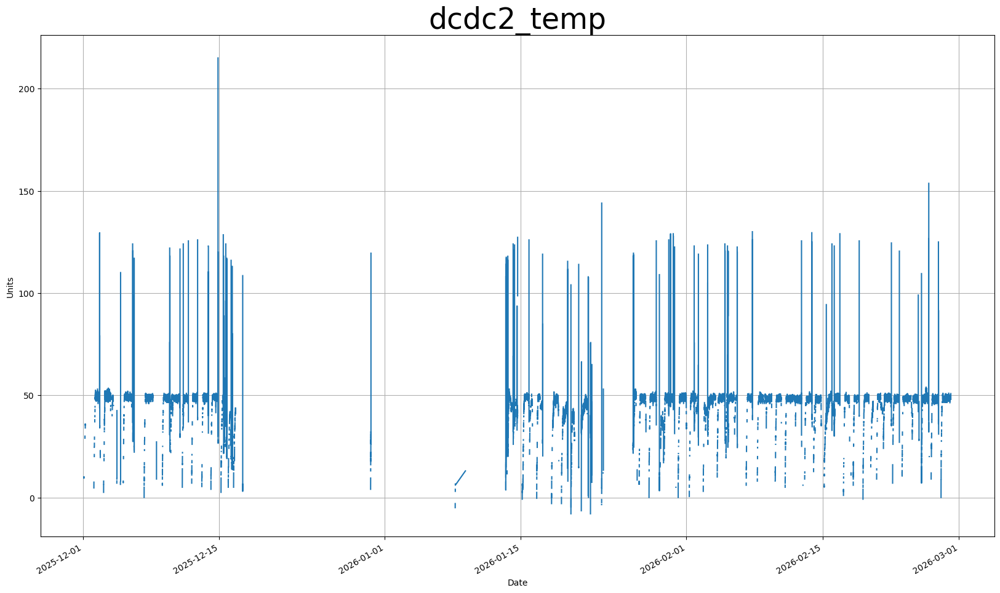

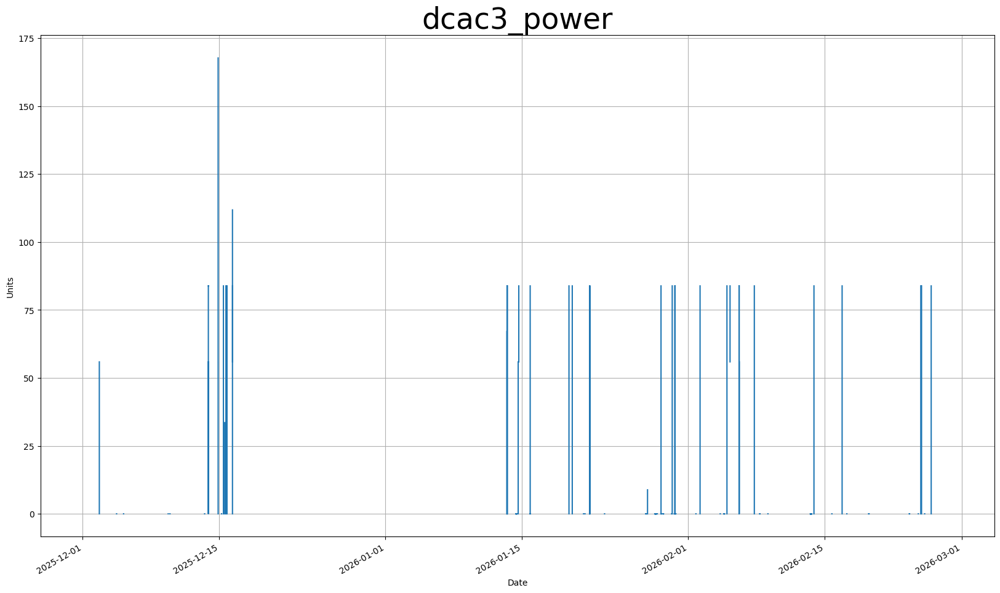

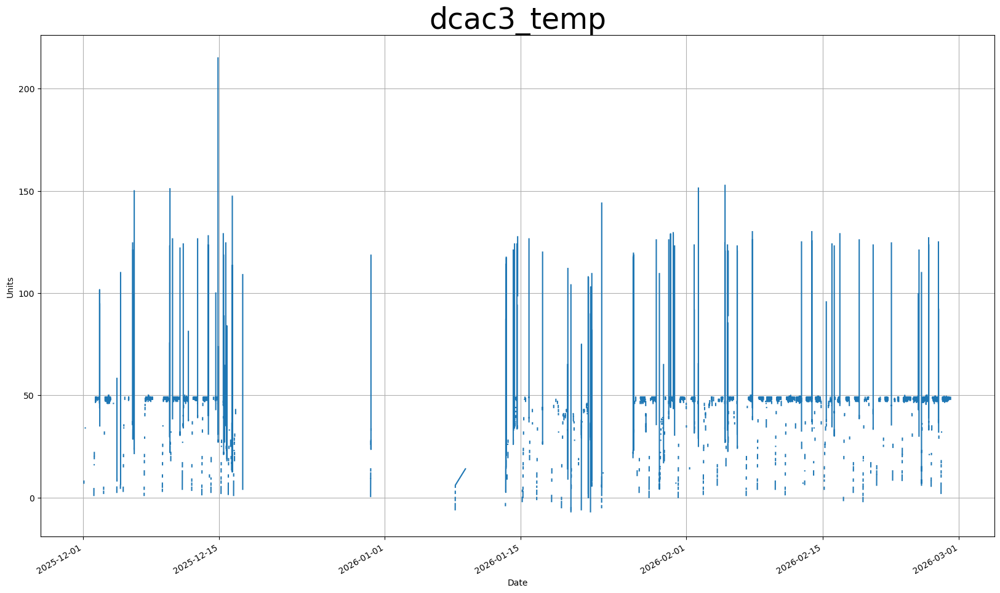

In [17]:
# Plot Complete Time Series #

for n, feat in enumerate(numerical):
    
    plot_num(df, feat, n)   

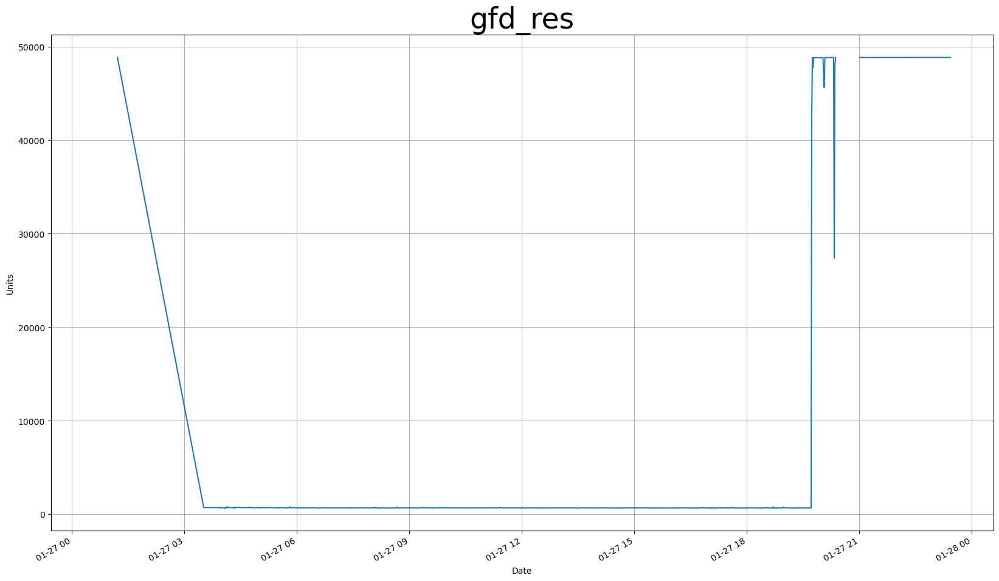

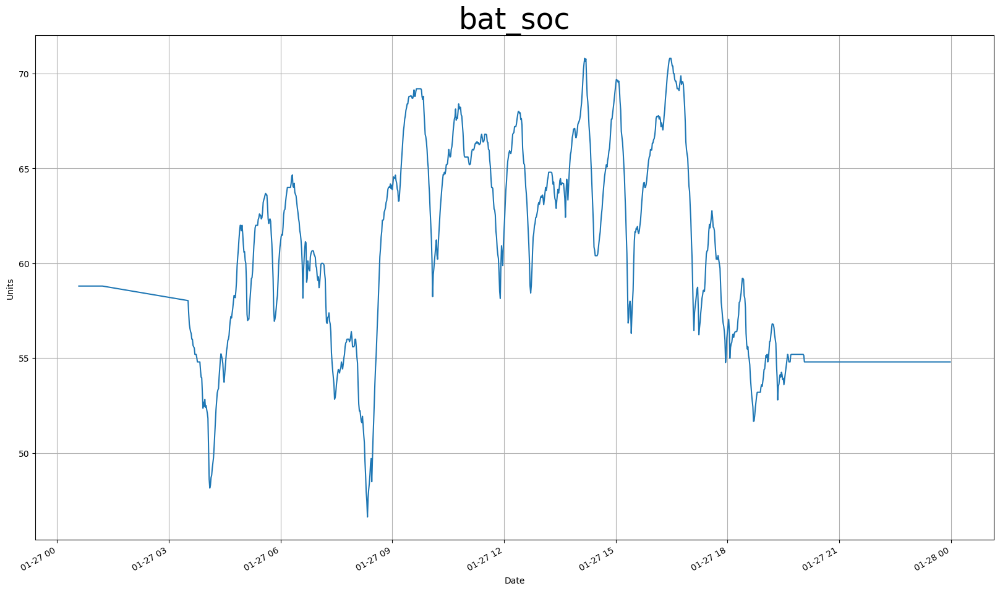

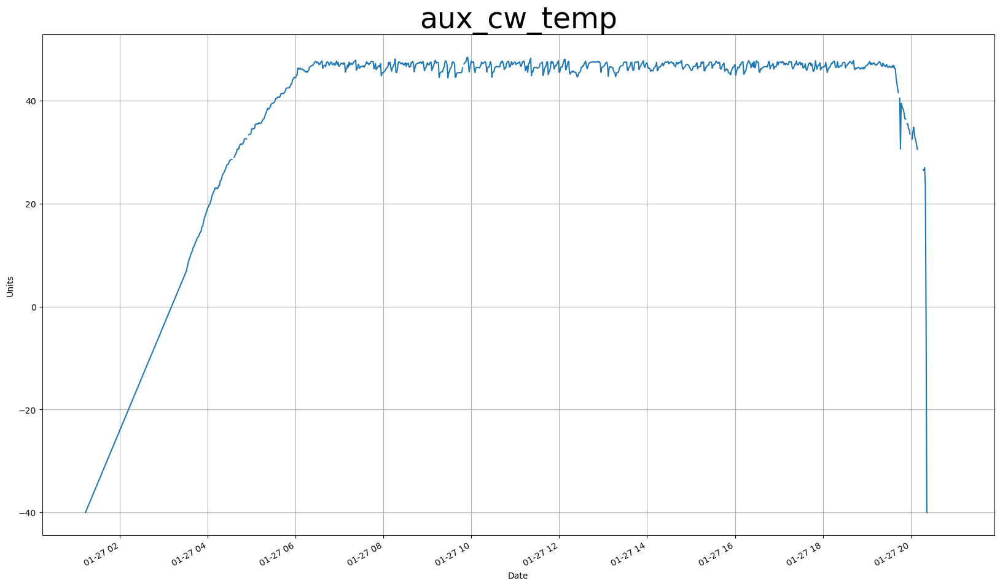

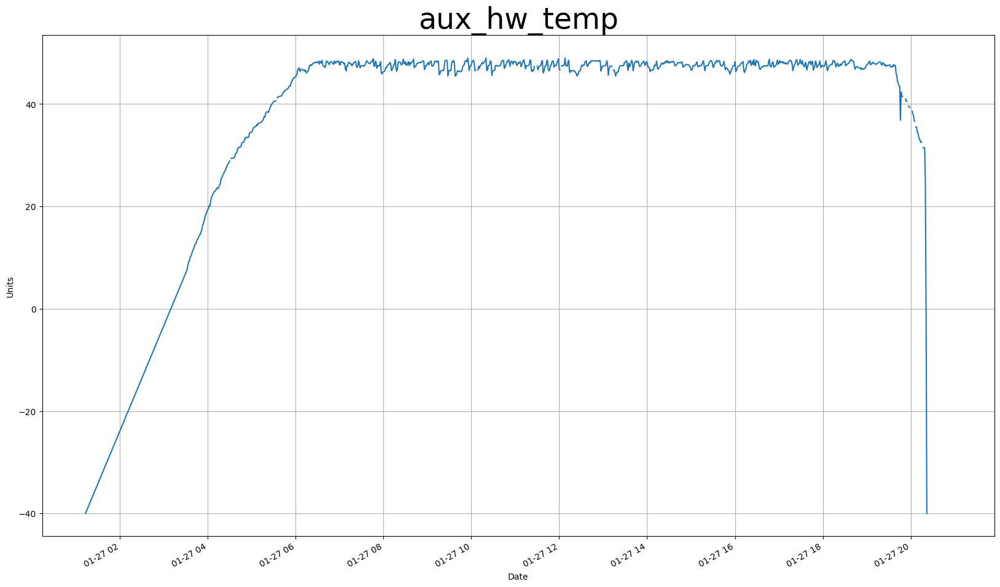

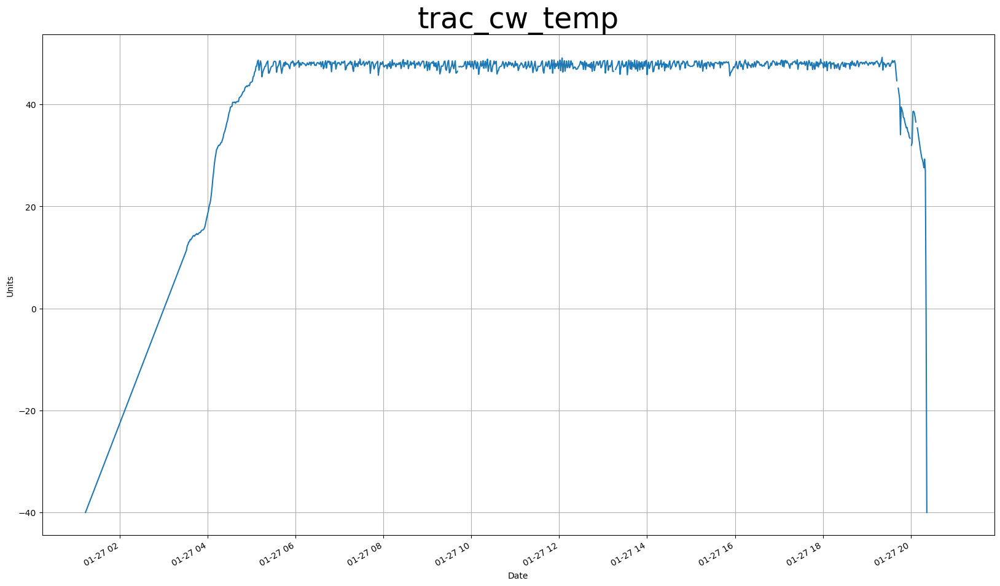

...

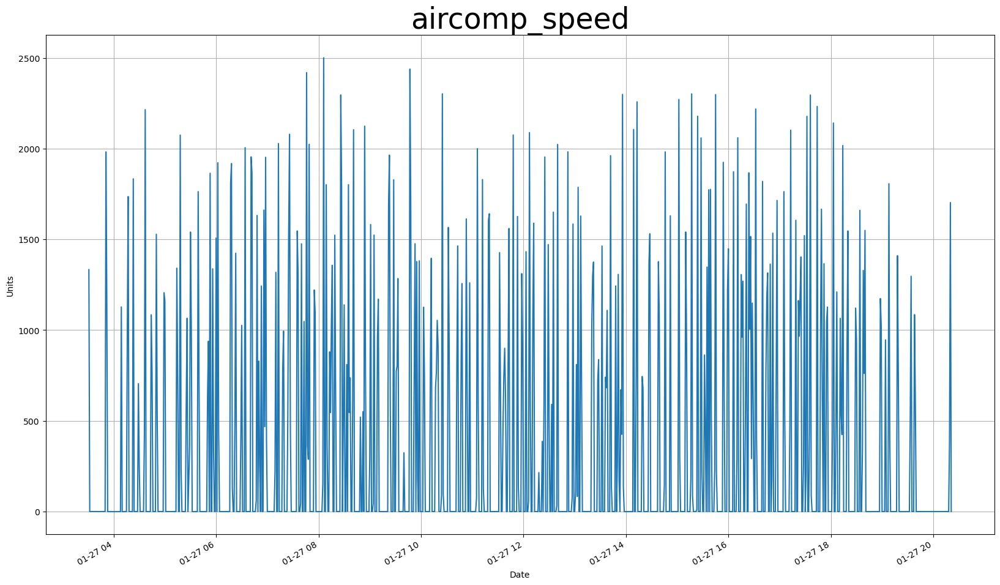

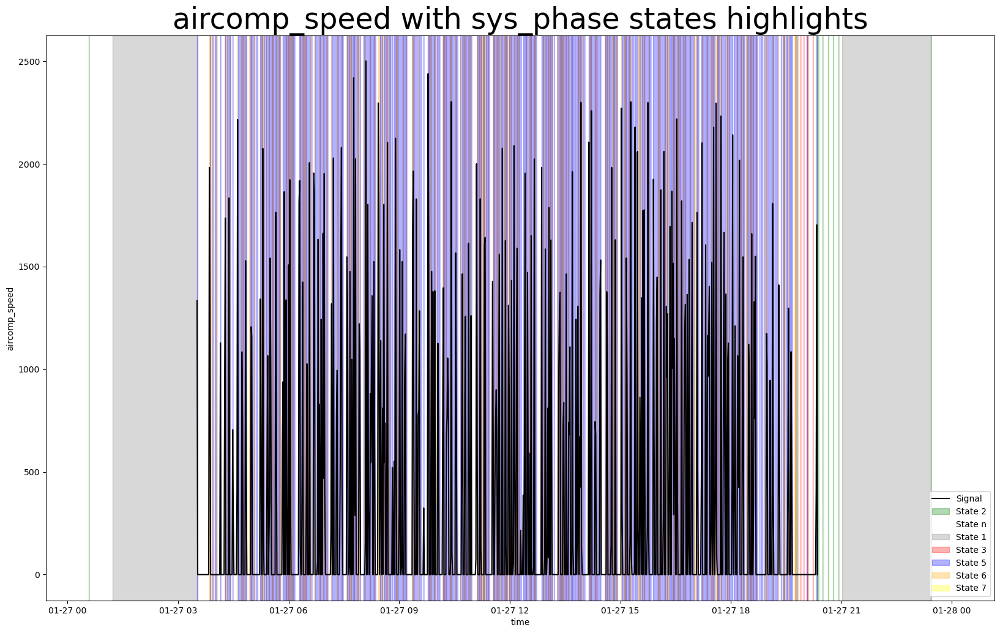

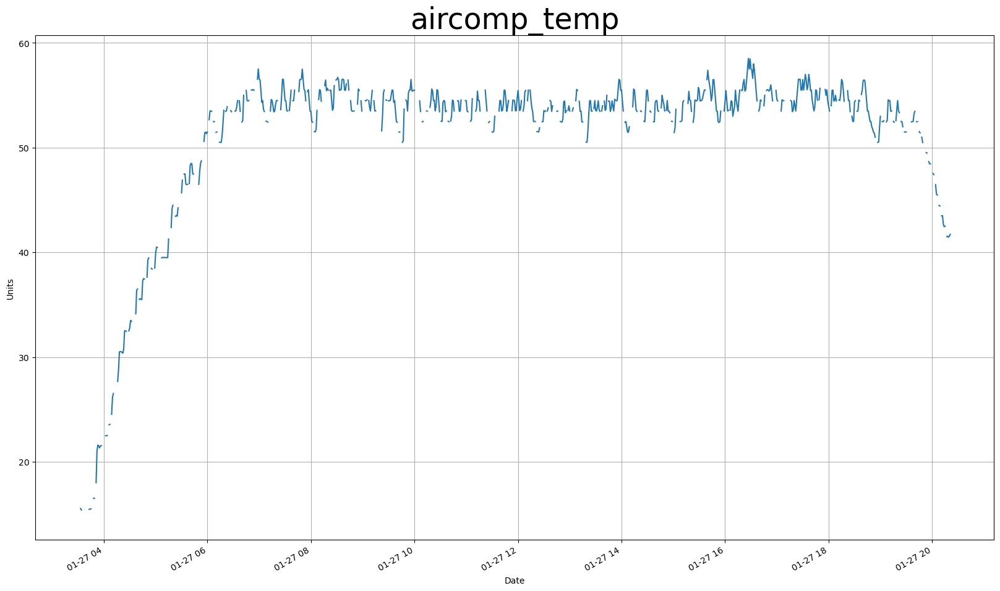

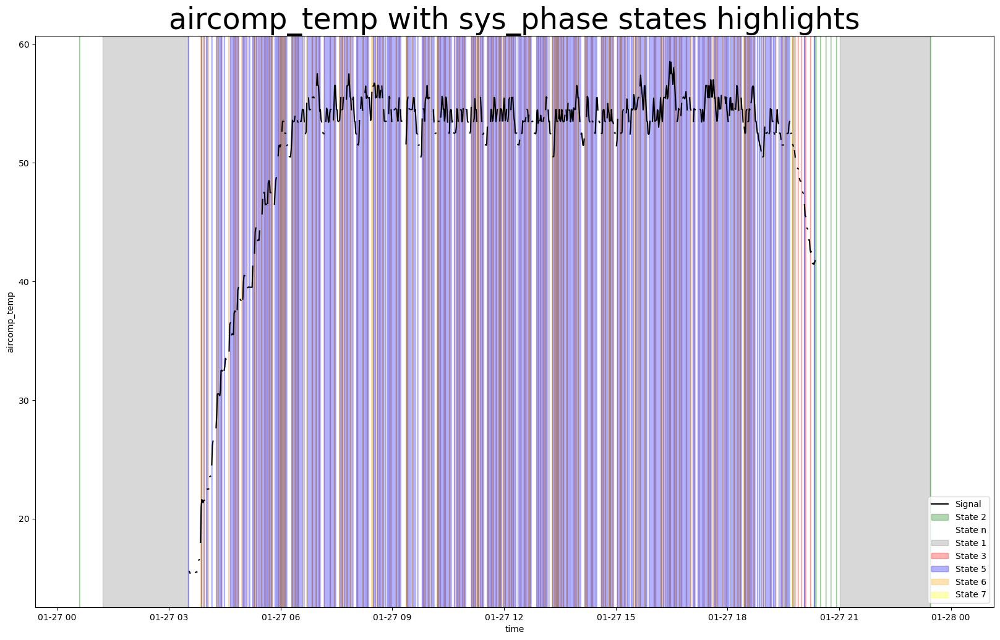

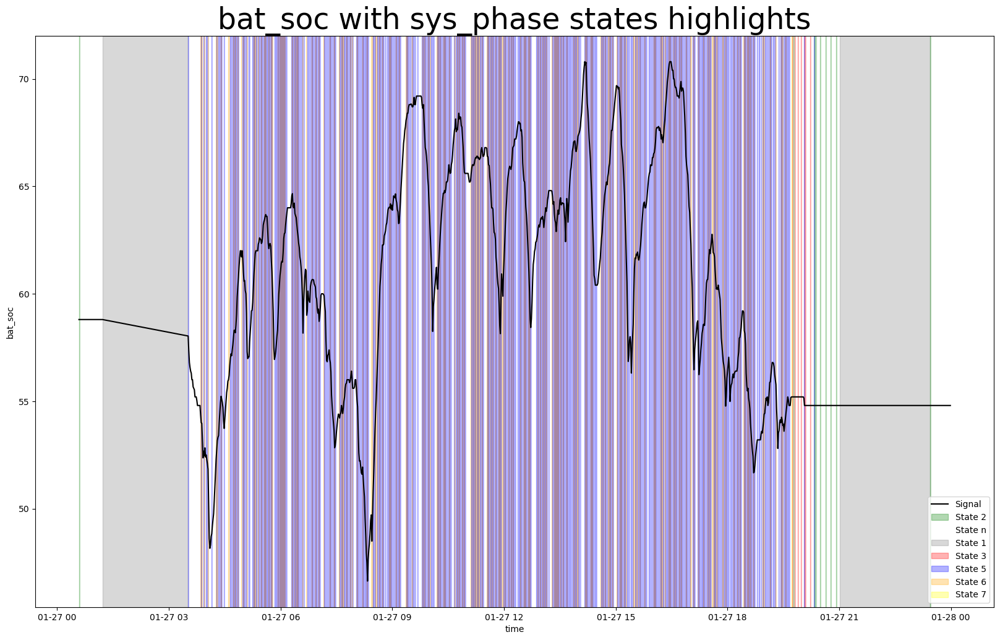

In [18]:
# Plot only a few days  #

first_day = '2026-01-27'
last_day = '2026-01-27'

for n, feat in enumerate(numerical):
    
    plot_num(df.loc[first_day : last_day], feat, n)

plot_num(df.loc[first_day : last_day], 'aircomp_speed')
plot_numbycat(df.loc[first_day : last_day], 'aircomp_speed', 'sys_phase')

plot_num(df.loc[first_day : last_day], 'aircomp_temp')
plot_numbycat(df.loc[first_day : last_day], 'aircomp_temp', 'sys_phase')

plot_numbycat(df.loc[first_day : last_day], 'bat_soc', 'sys_phase')

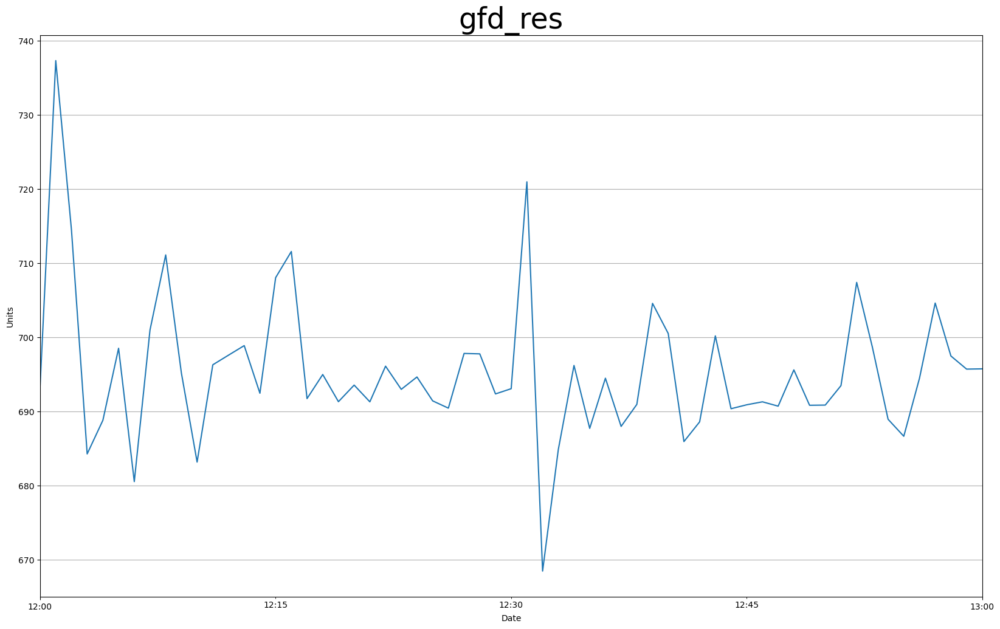

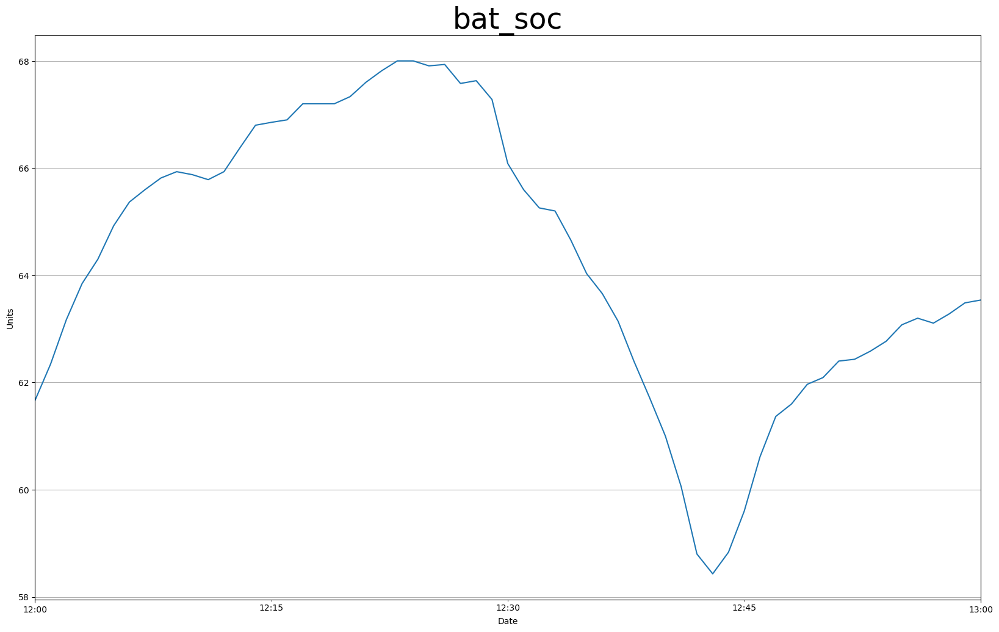

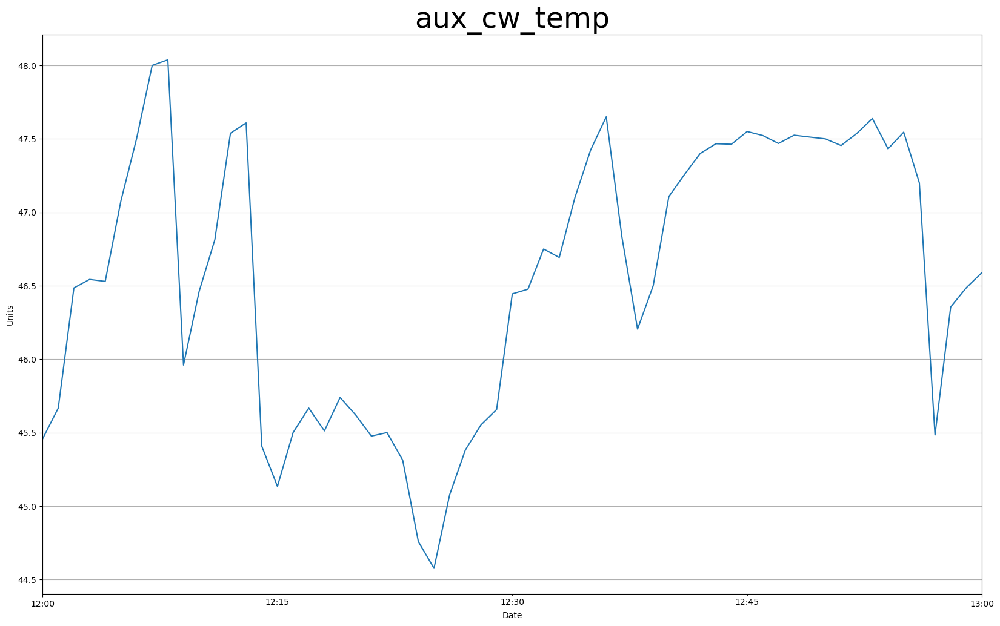

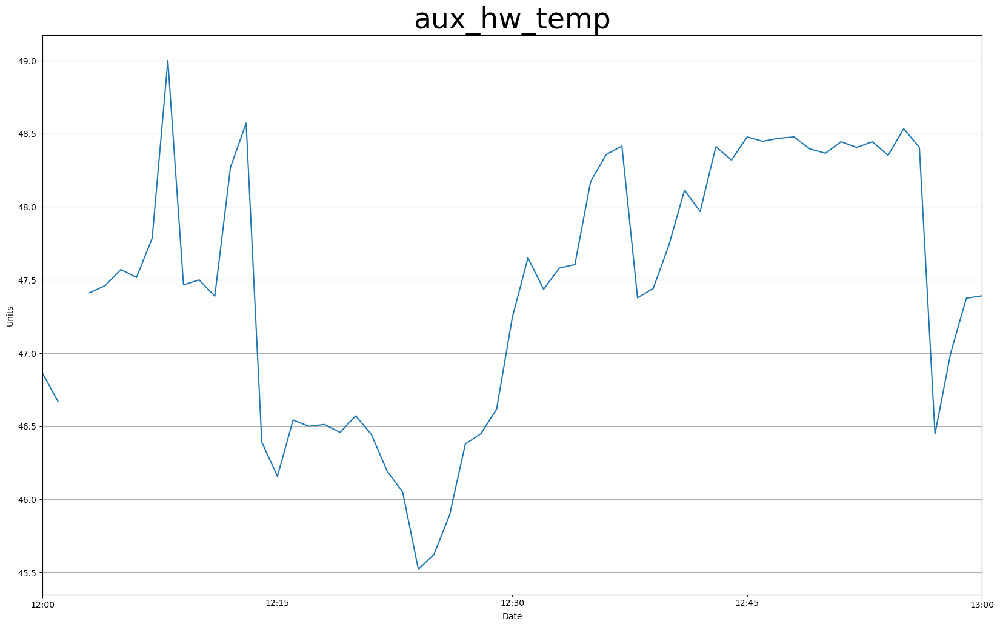

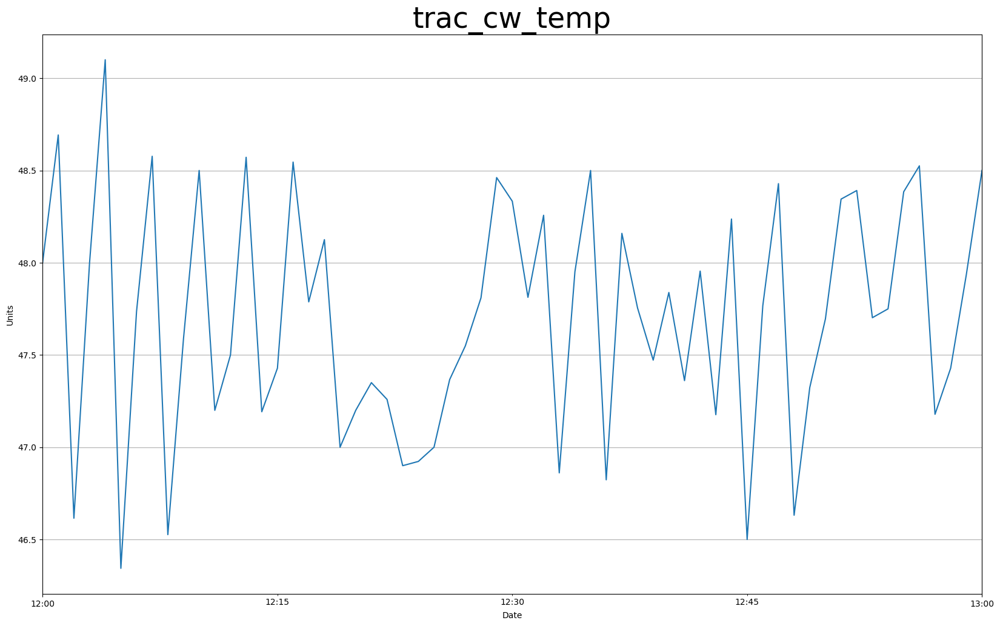

...

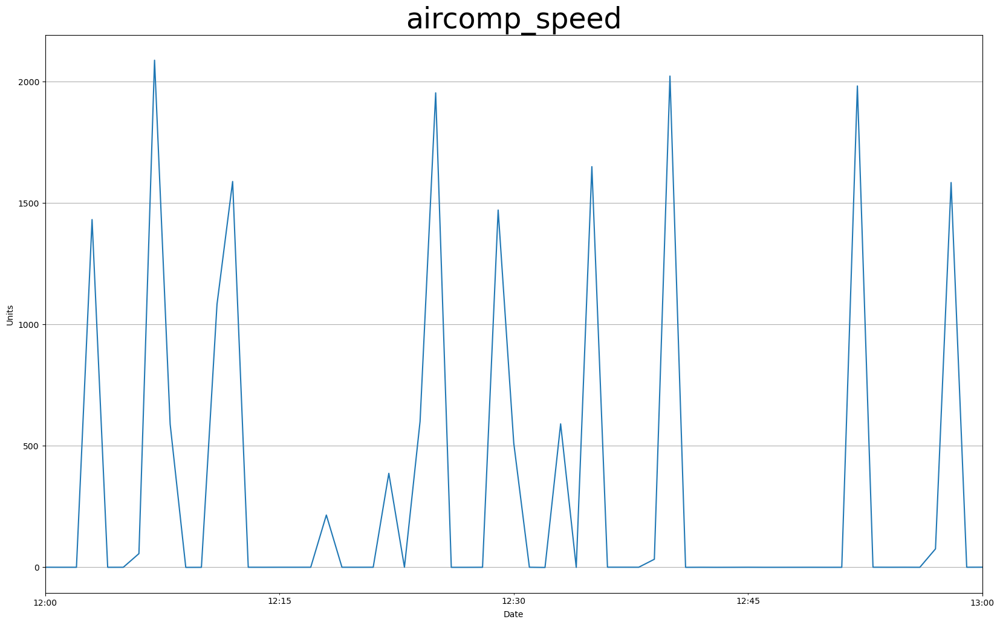

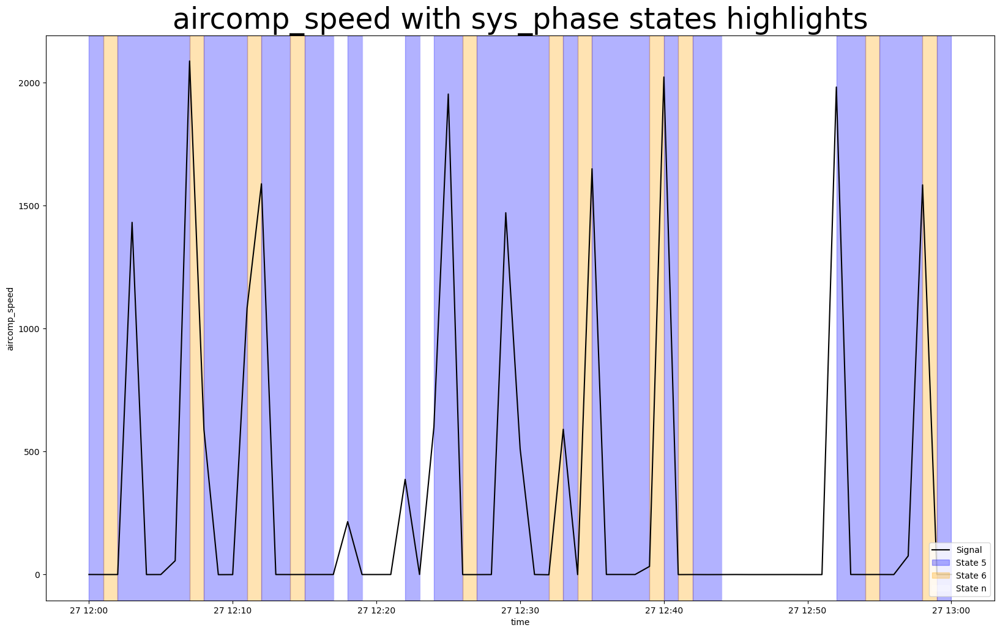

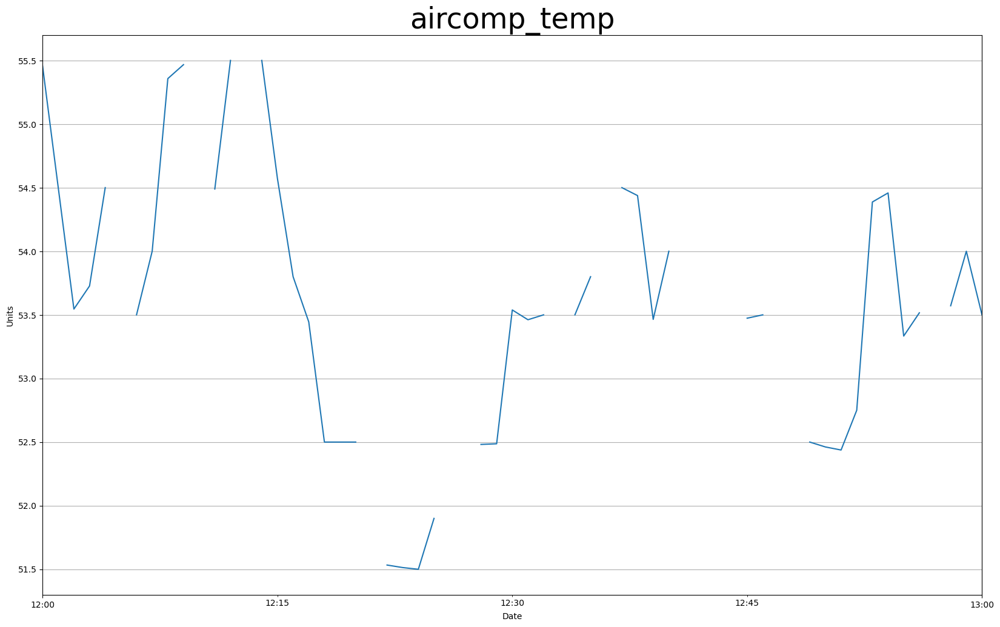

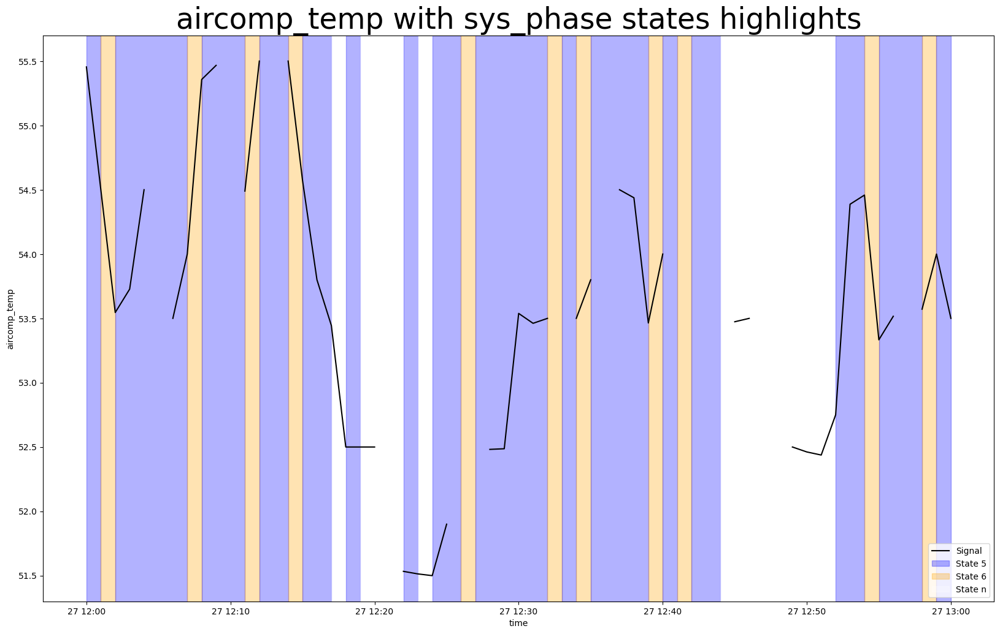

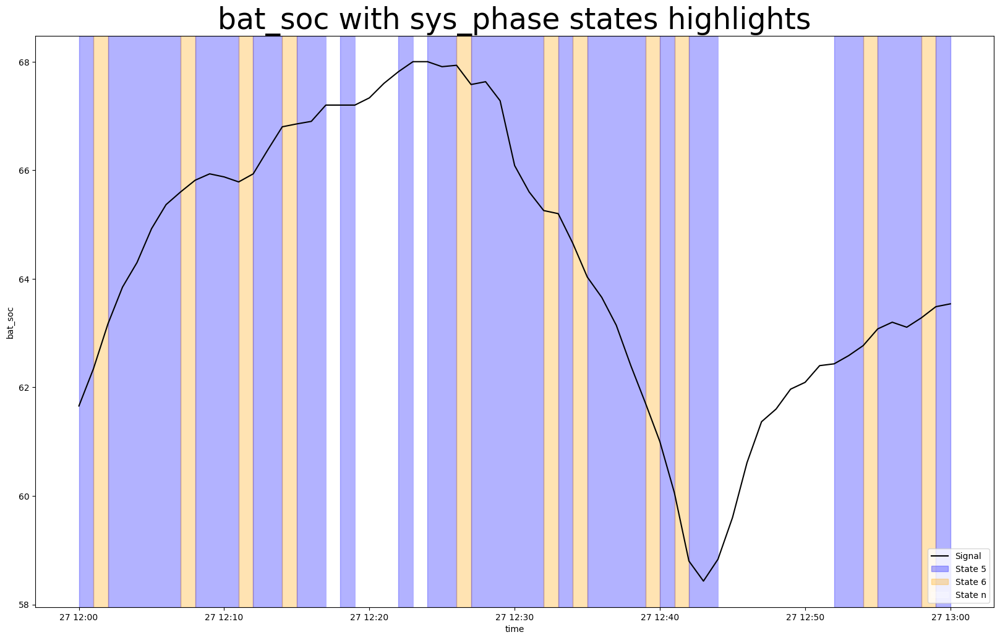

In [19]:
# Plot only a few hours #

first_day = '2026-01-27 12:00:00'
last_day = '2026-01-27 13:00:00'

for n, feat in enumerate(numerical):
    
    plot_num(df.loc[first_day : last_day], feat, n)

plot_num(df.loc[first_day : last_day], 'aircomp_speed')
plot_numbycat(df.loc[first_day : last_day], 'aircomp_speed', 'sys_phase')

plot_num(df.loc[first_day : last_day], 'aircomp_temp')
plot_numbycat(df.loc[first_day : last_day], 'aircomp_temp', 'sys_phase')

plot_numbycat(df.loc[first_day : last_day], 'bat_soc', 'sys_phase')

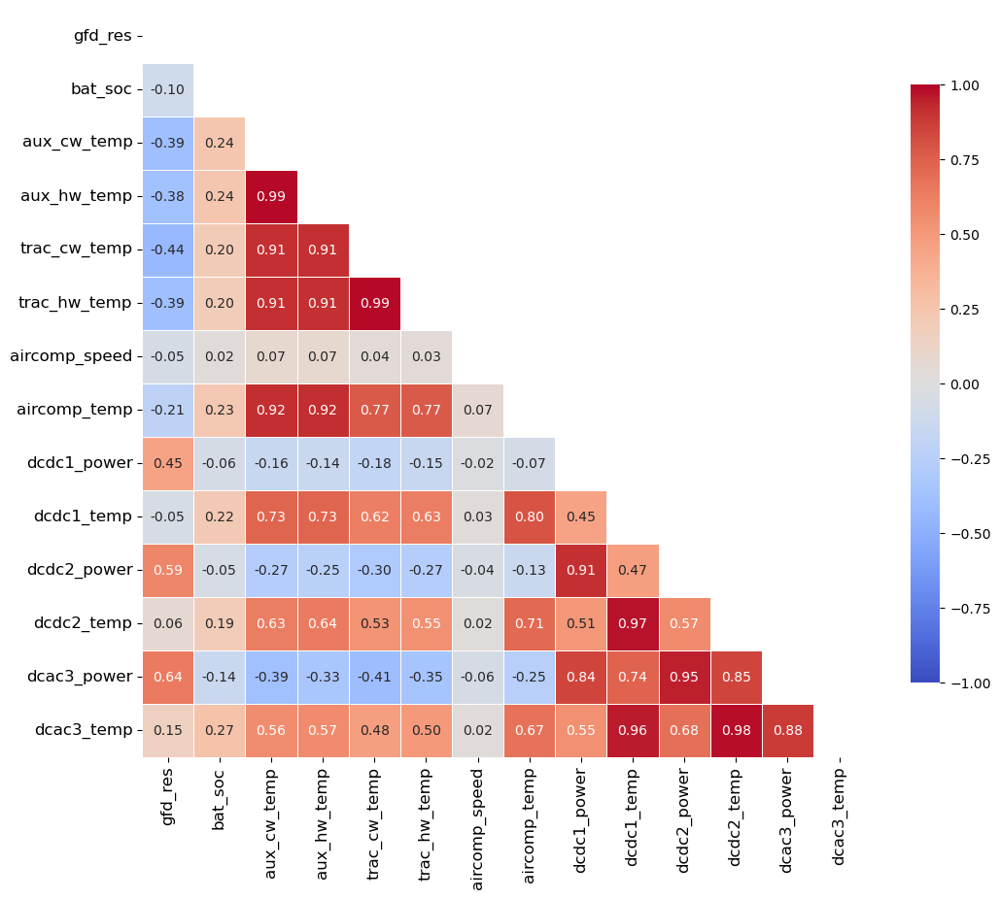

In [20]:
# Correlation Heatmap

# 1. Calculate the correlation matrix
# Assuming 'numerical' is your list of column names
corr_matrix = df[numerical].corr()

# 2. Create a mask to hide the upper triangle (optional but cleaner)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# 3. Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# 4. Draw the heatmap
sns.heatmap(
    corr_matrix, 
    mask=mask, 
    annot=True,          # Show the correlation values
    fmt=".2f",           # Format to 2 decimal places
    cmap='coolwarm',     # Red for positive, Blue for negative correlation
    vmin=-1, vmax=1,     # Ensure the scale is always -1 to 1
    center=0, 
    linewidths=.5, 
    cbar_kws={"shrink": .8})

#plt.title('Correlation Heatmap of Numerical Features', fontsize=18, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

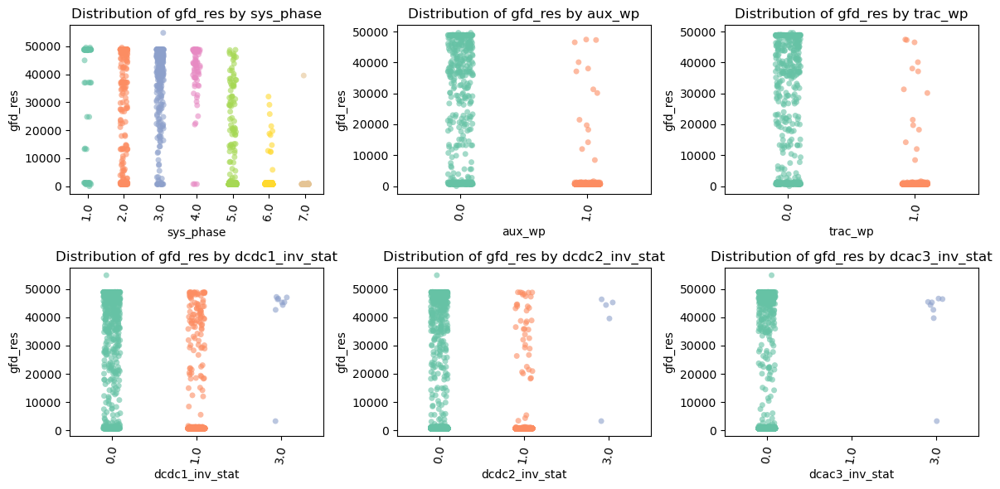

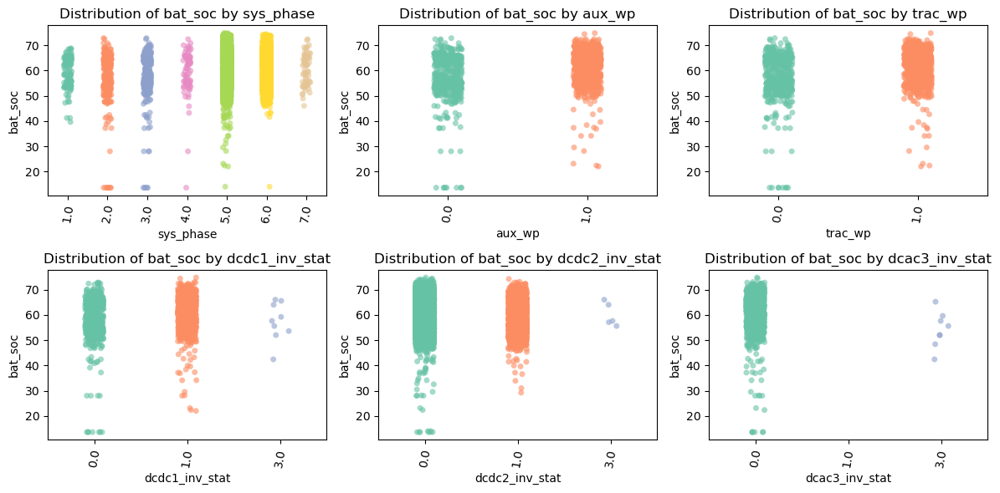

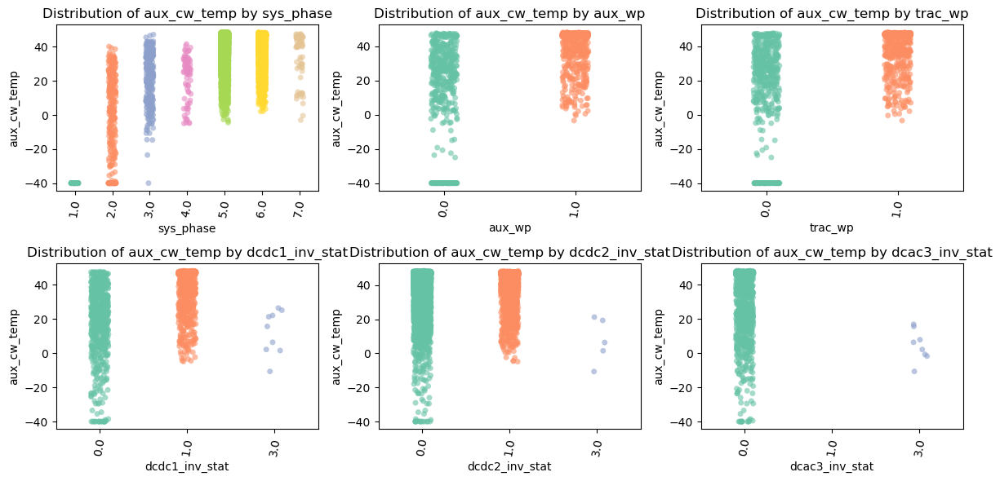

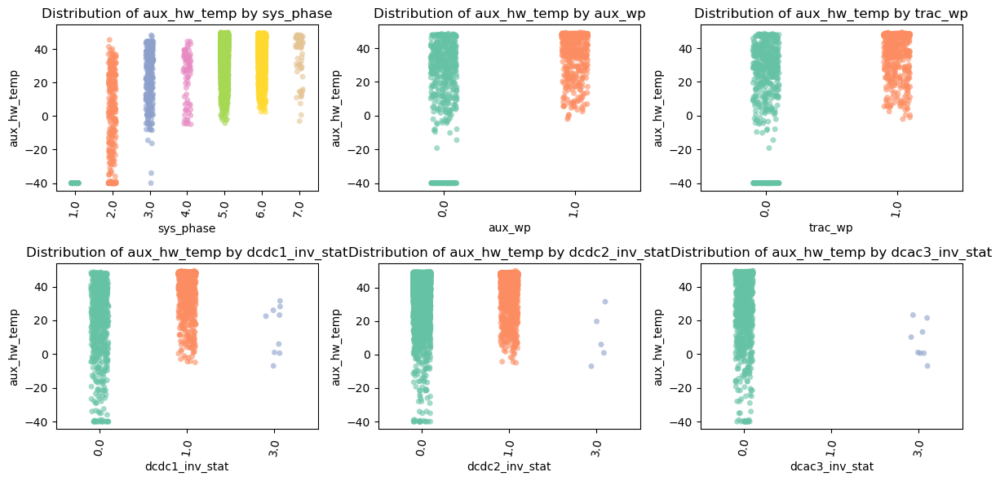

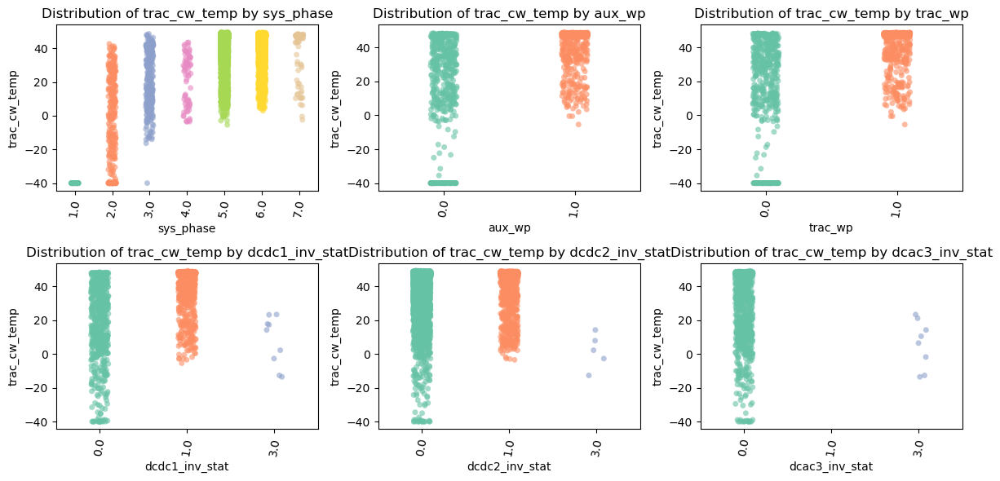

...

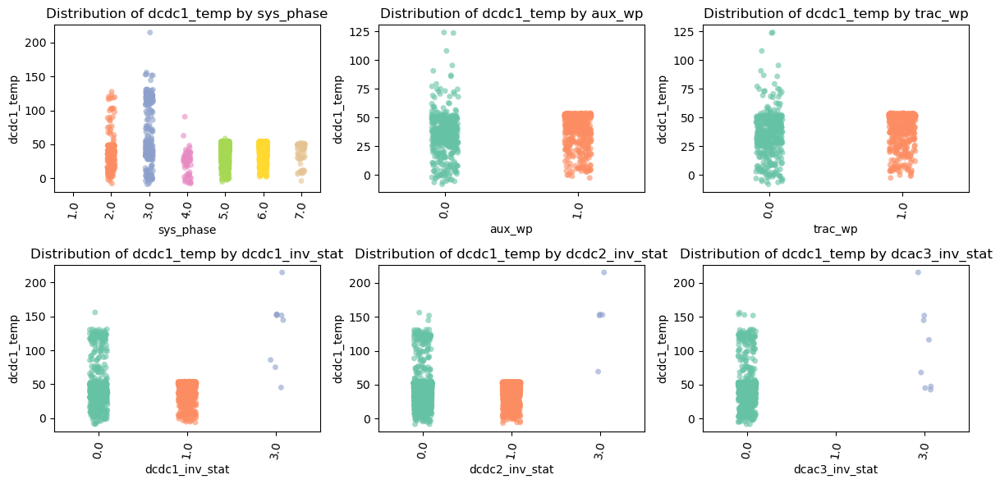

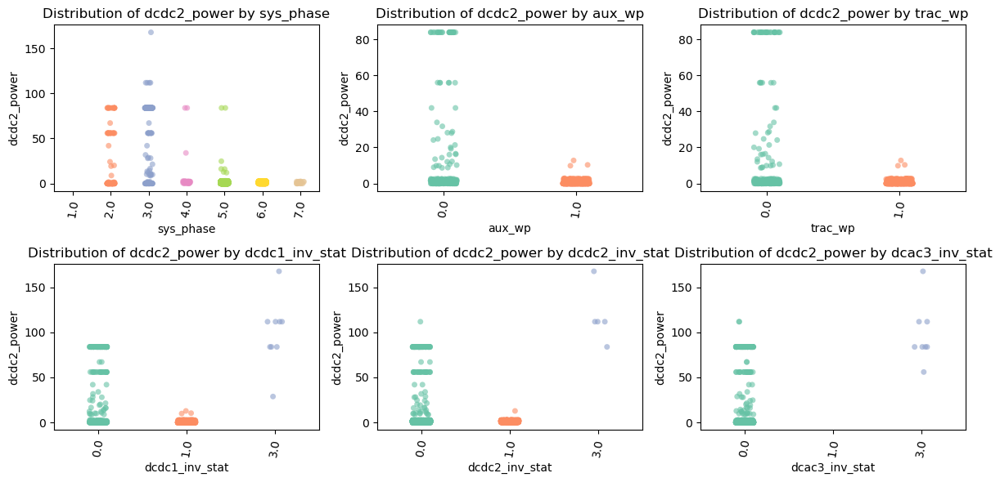

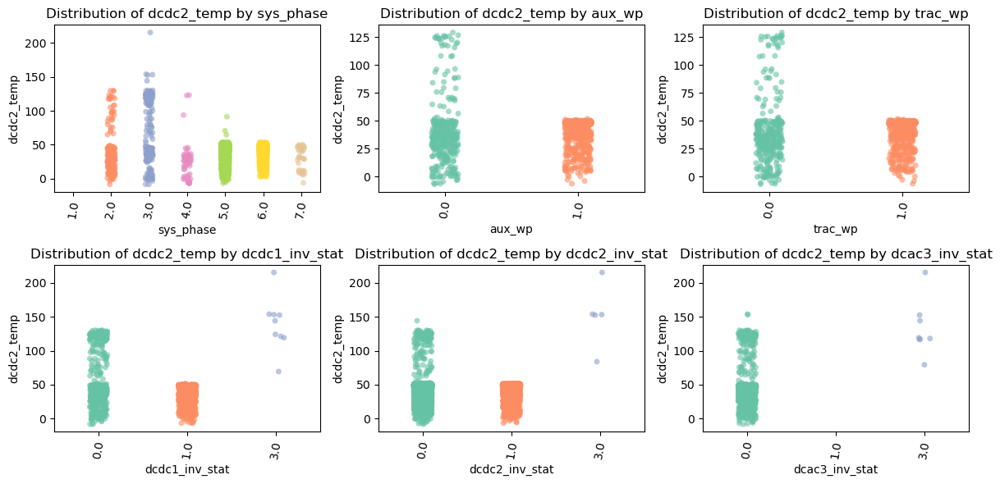

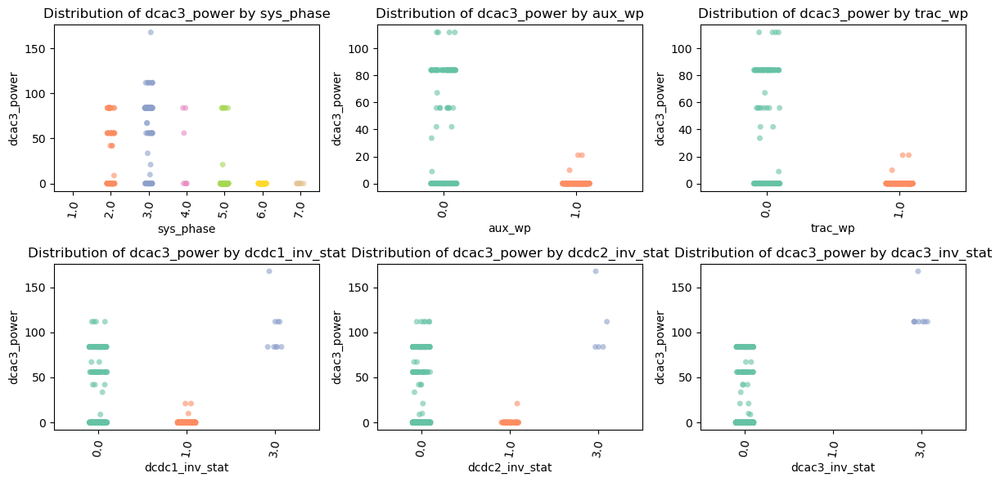

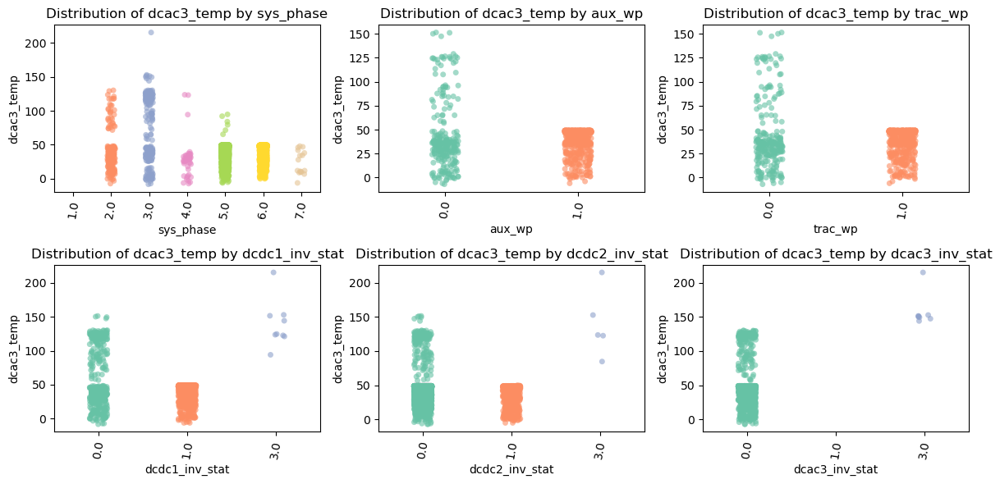

In [21]:
# Numerical vs categorical # Distribution of signals #

for target_numerical in numerical:

    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 6))
    axes = axes.flatten()

    for i, col in enumerate(categorical):
        sns.stripplot(data=df, 
                      x=col, 
                      y=target_numerical, 
                      ax=axes[i], 
                      jitter=True, 
                      alpha=0.6, 
                      palette="Set2", 
                      hue=col, 
                      legend=False)
    
        axes[i].set_title(f'Distribution of {target_numerical} by {col}')
        axes[i].tick_params(axis='x', rotation=80)

    plt.tight_layout()
    plt.show()

In [22]:


#########################################
#                                       #
######## Preparation to MODELING ########
#                                       #
#########################################


In [23]:
# remove features with more than 75% of NA's 

# and highly correlated ones

df = df.drop(['aux_wp', 
              'trac_wp', 
              'dcdc1_inv_stat', 
              'dcdc2_inv_stat',
              'dcac3_inv_stat',
              'dcdc1_temp',
              'dcdc2_temp',
              'dcac3_temp',
              'dcdc2_power',
              'dcac3_power',
              ], axis=1)

In [24]:
numerical = df.select_dtypes(include='number').columns.tolist()

categorical = df.select_dtypes(include='category').columns.tolist()

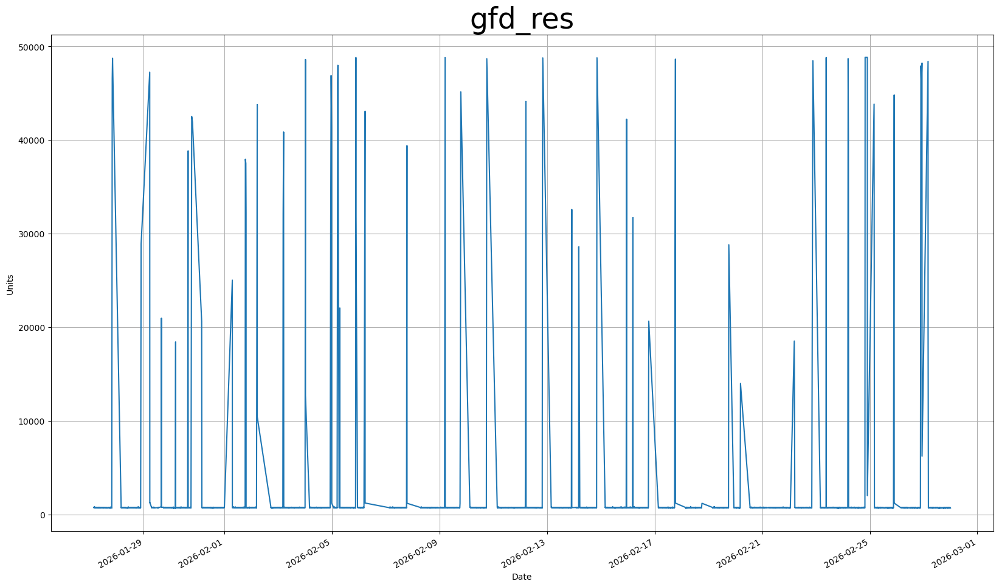

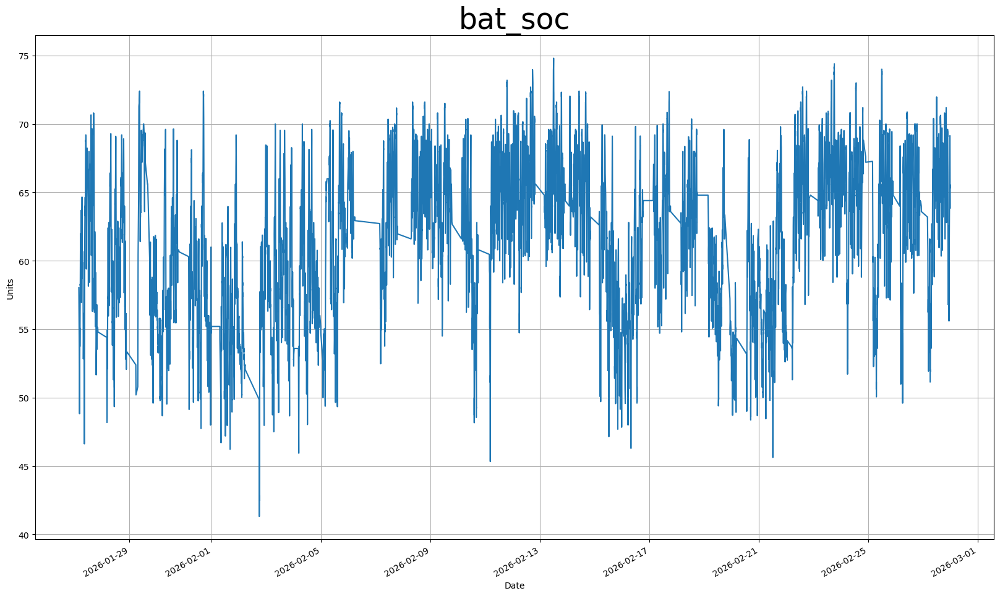

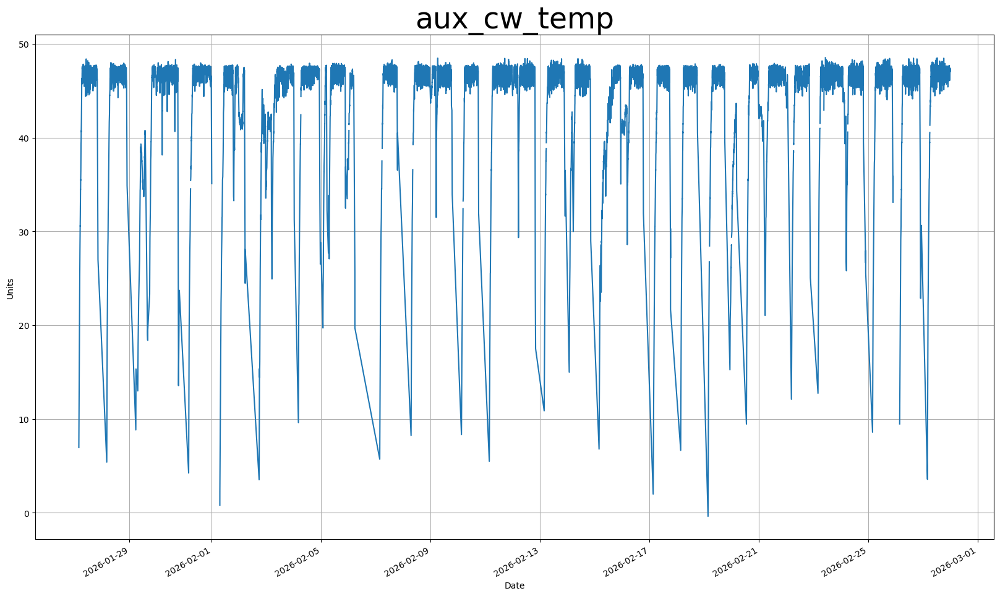

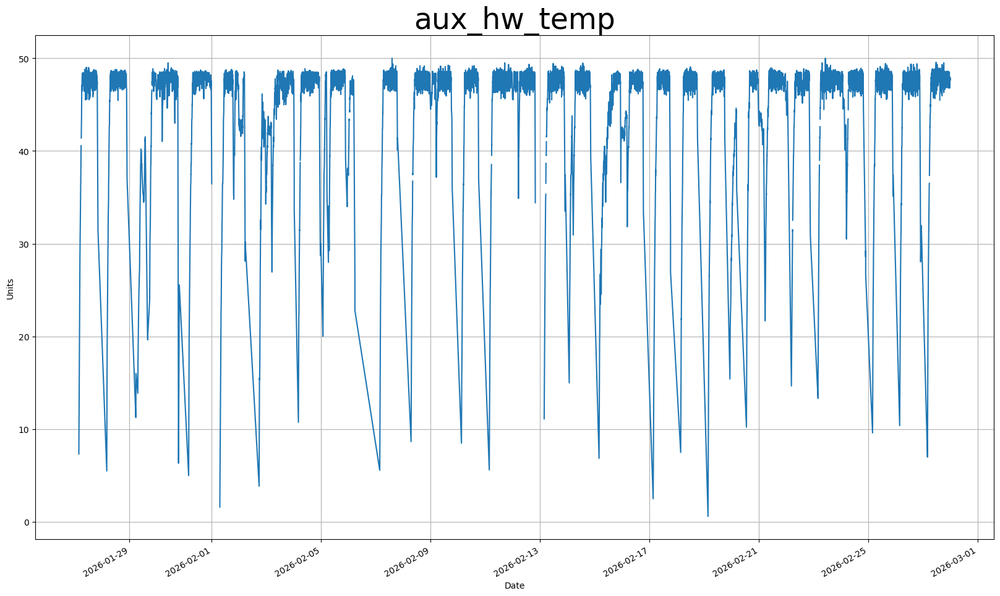

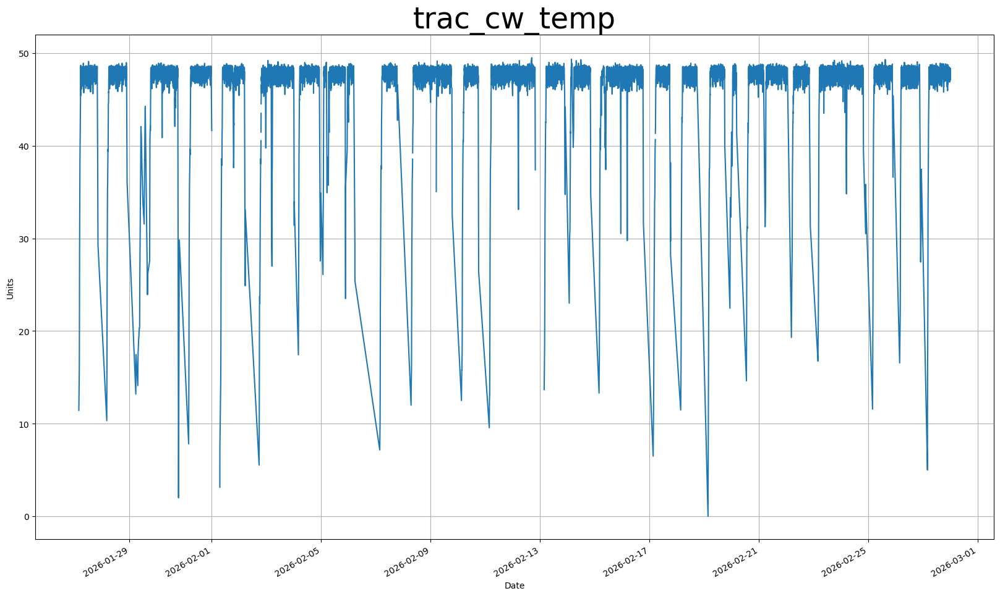

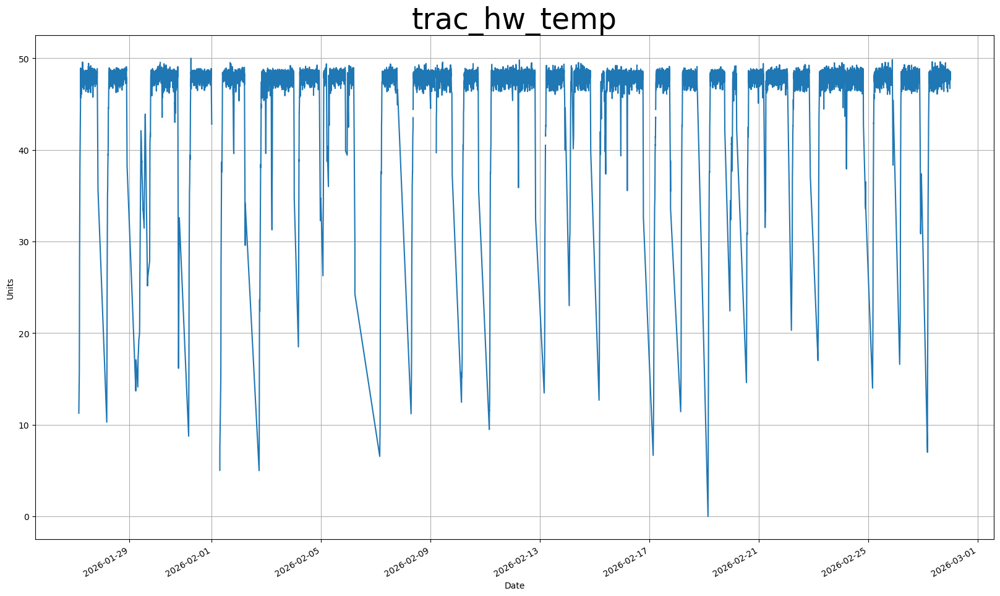

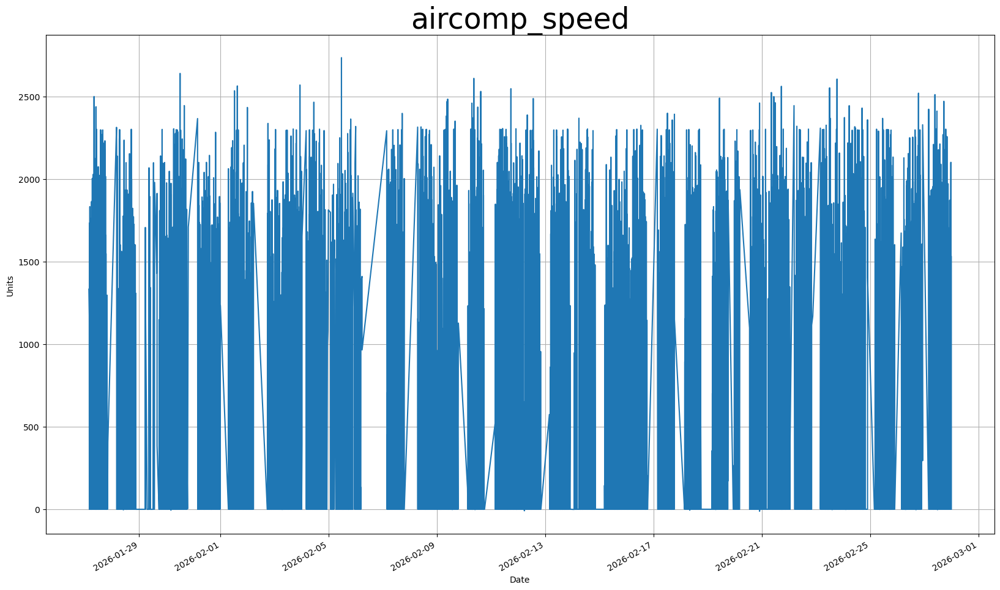

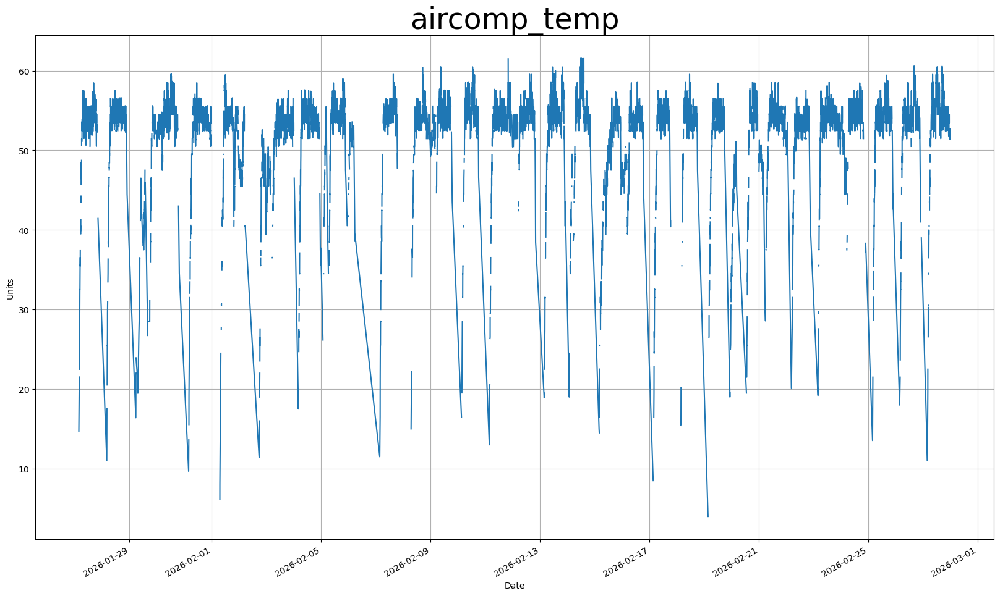

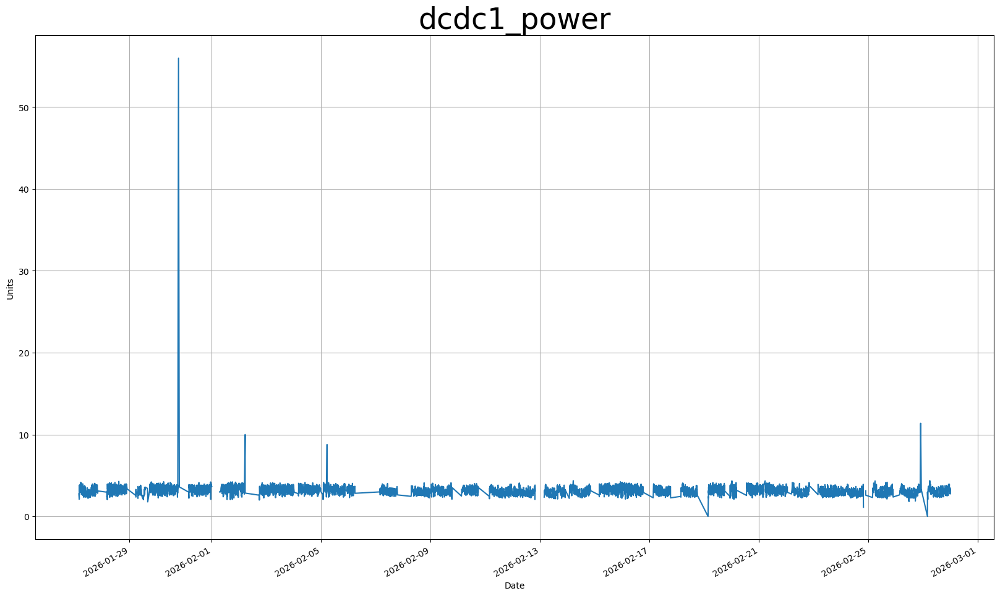

In [25]:
# use only bus states 4 and 5 TRAIN

df_train = df[(df['sys_phase'] == 4.0) | (df['sys_phase'] == 5.0)].loc['2026-01-27':'2026-02-27']
#df_train = df_train.drop(['sys_phase'], axis=1)

for n, feat in enumerate(numerical): plot_num(df_train, feat, n)

# Cap outliers #

# 1. Isolate only the numerical columns
numeric_df = df_train.select_dtypes(include=[np.number])

# 2. Calculate Q1, Q3, and IQR for all columns at once
Q1 = numeric_df.quantile(0.25)
Q3 = numeric_df.quantile(0.75)
IQR = Q3 - Q1

# 3. Define the global lower and upper bounds
lower_bounds = 0 #Q1 - 1.5 * IQR
upper_bounds = Q3 + 1.5 * IQR

# 4. Cap the entire dataframe and update the original
df_train[numeric_df.columns] = numeric_df.clip(lower=lower_bounds, upper=upper_bounds, axis=1)

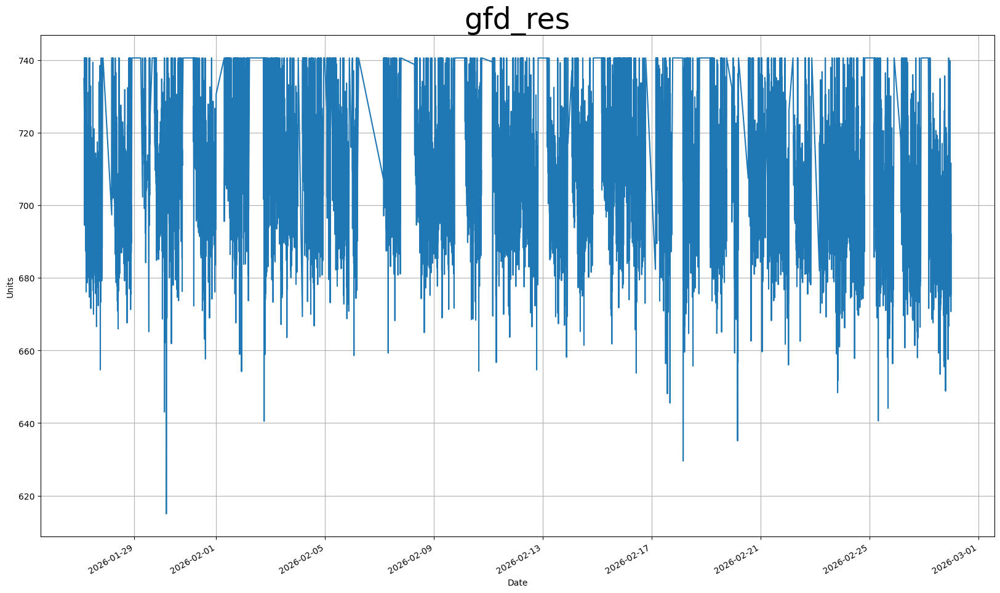

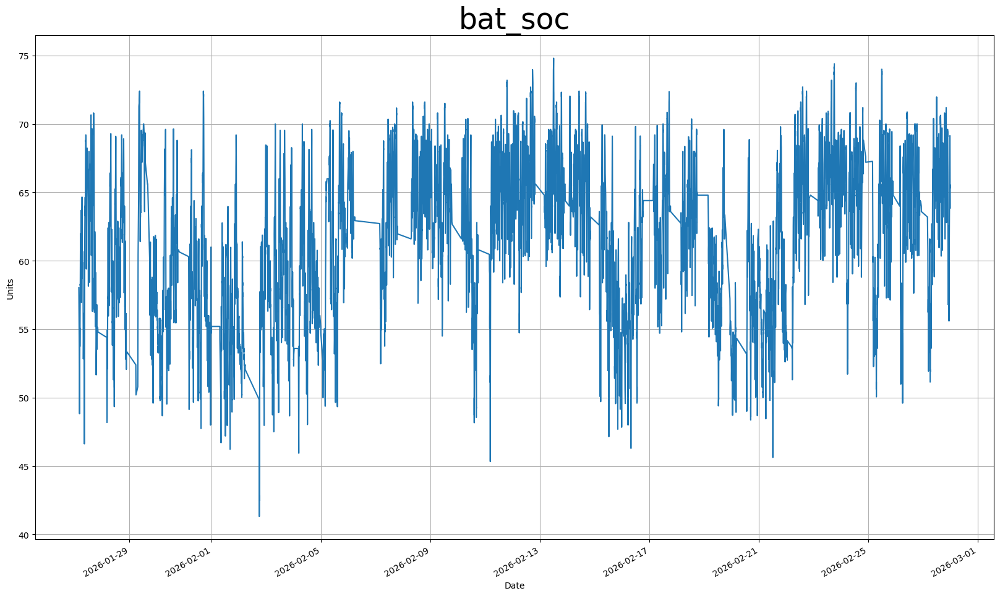

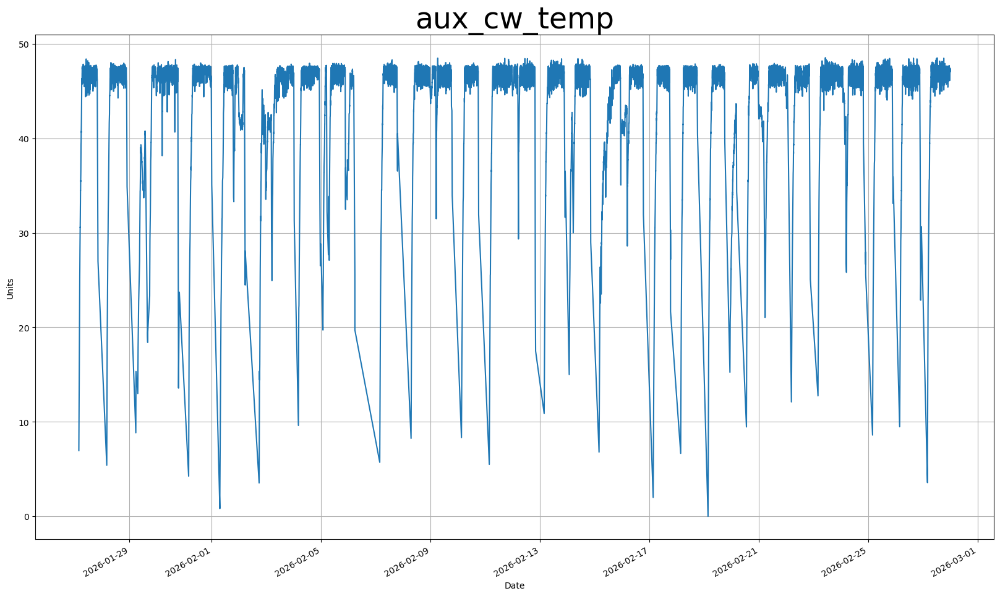

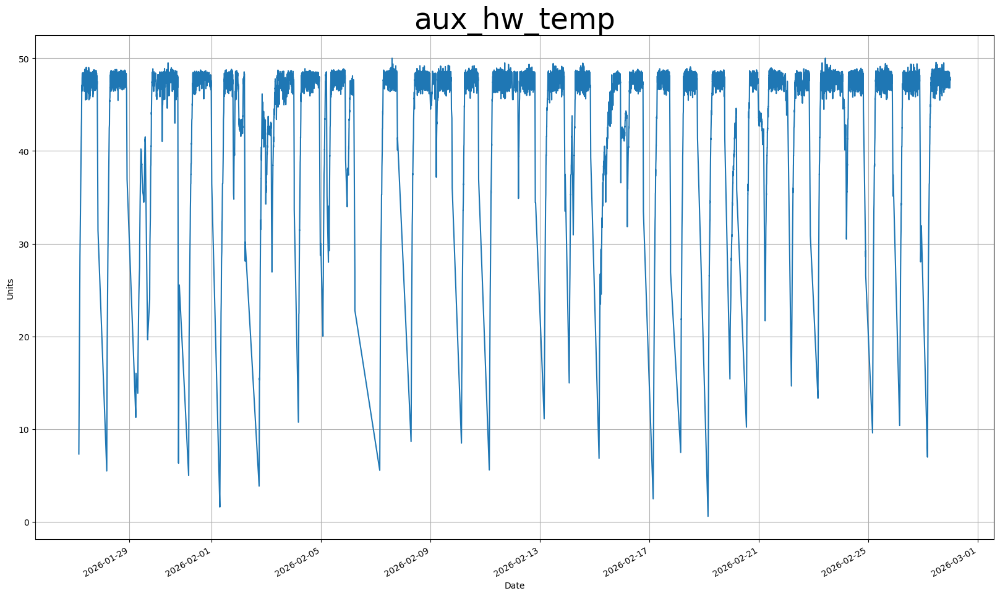

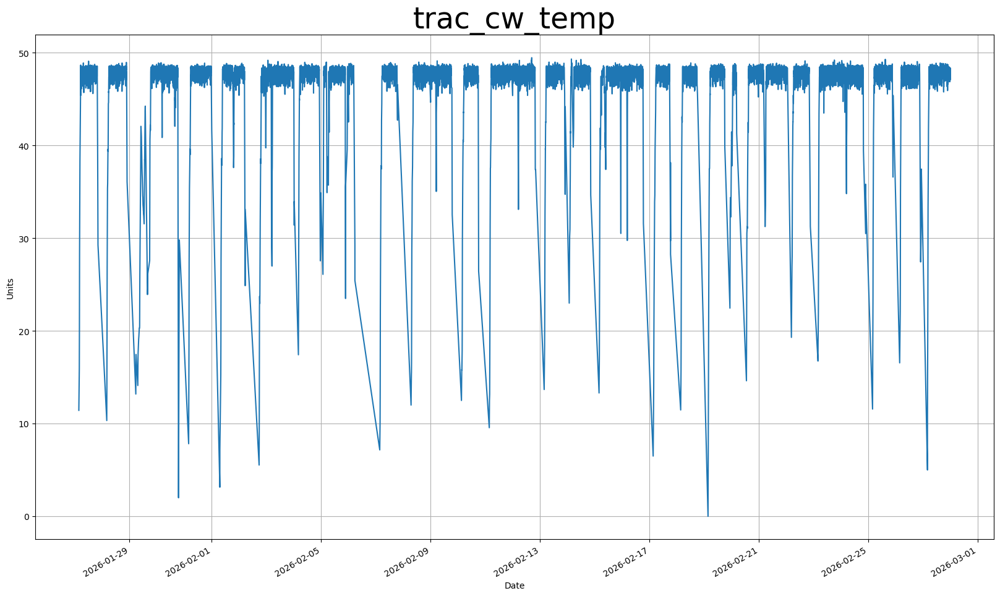

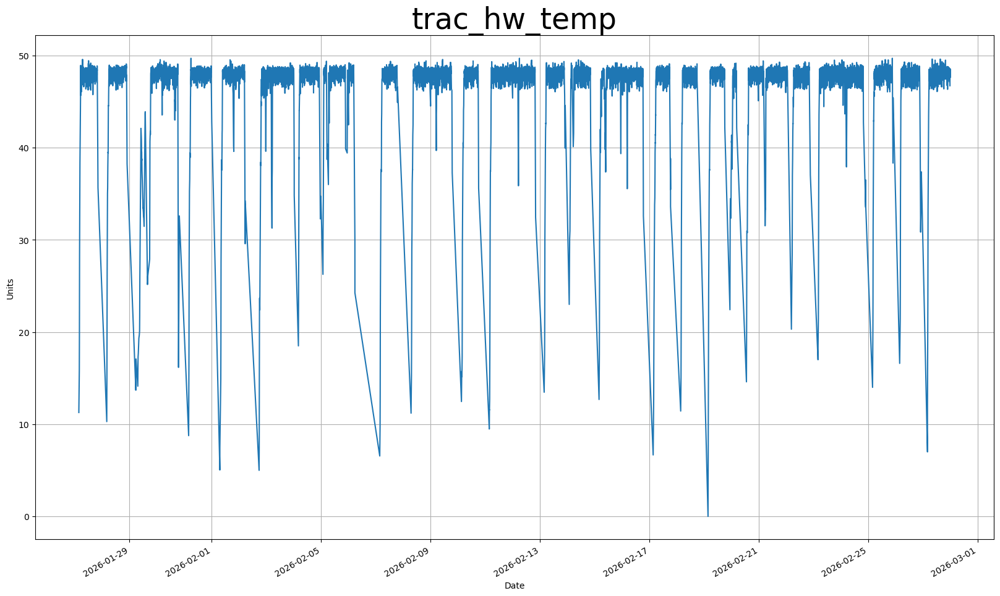

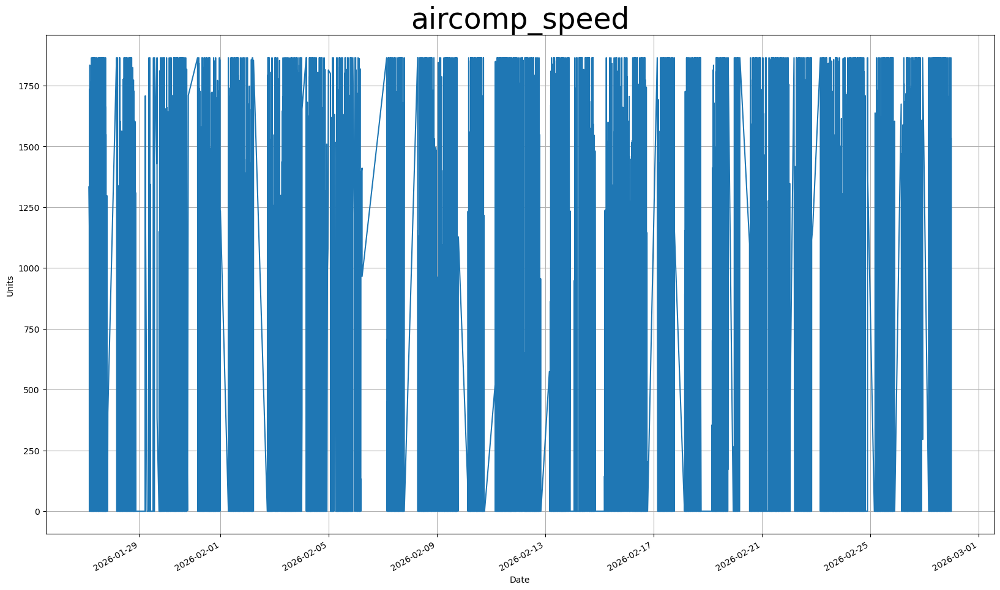

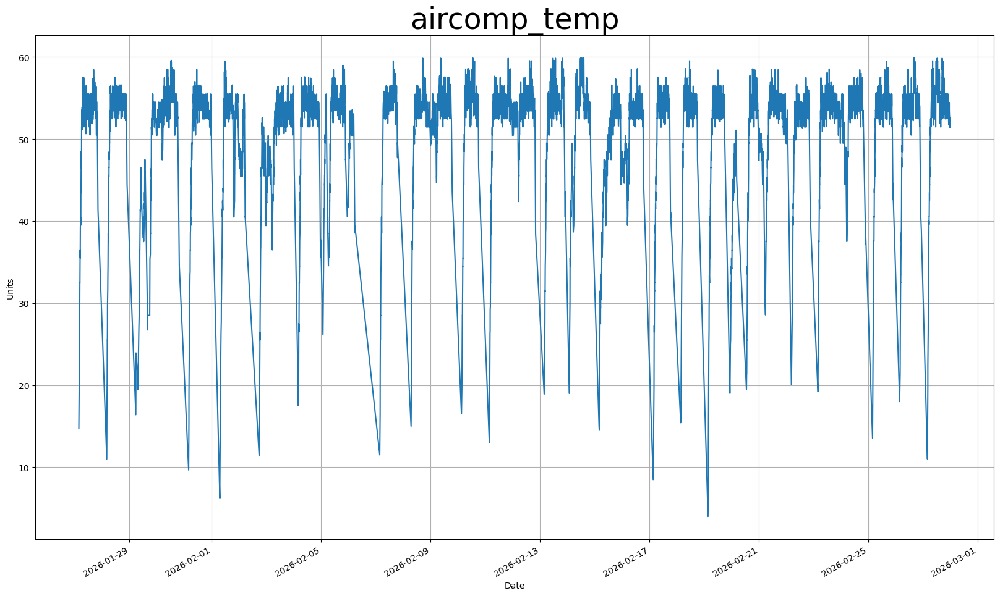

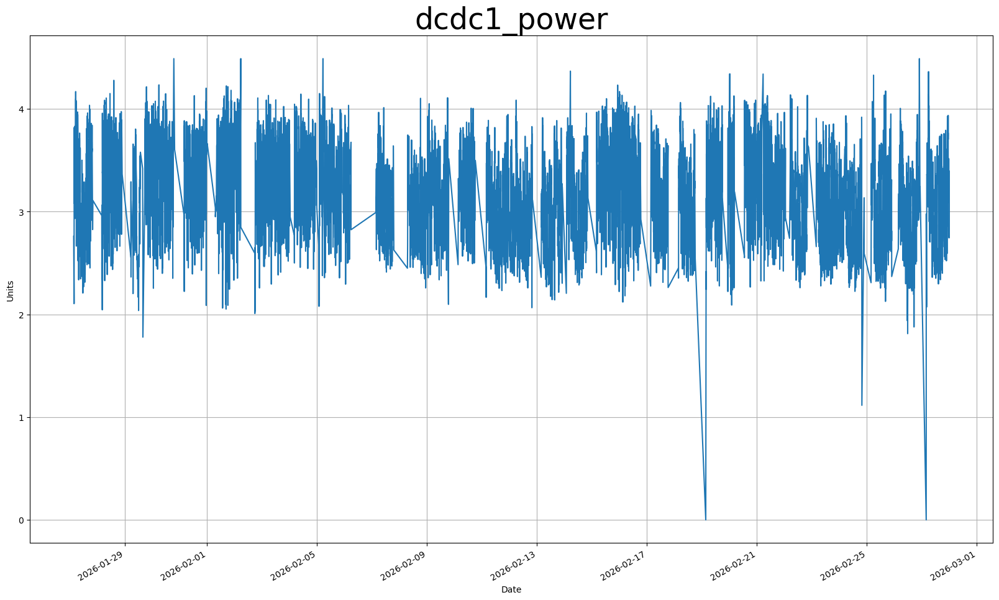

In [26]:
# Imputation

# 1. Ensure the DataFrame is sorted by the DatetimeIndex
df_train = df_train.sort_index()

# 2. Identify numeric and categorical columns
num_cols = df_train.select_dtypes(include='number').columns
cat_cols = df_train.columns.difference(num_cols)

# 3. Identify session boundaries (gap > 6 hours)
time_deltas = df_train.index.to_series().diff()
session_breaks = time_deltas > pd.Timedelta(hours=6)
session_ids = session_breaks.cumsum()

# 4. Define the imputation function applied per session
def impute_session(group):
    # Copy to avoid SettingWithCopy warnings
    group_imputed = group.copy()
    
    # Numerical pipeline: interpolate -> ffill -> bfill
    if len(num_cols) > 0:
        group_imputed[num_cols] = (
            group_imputed[num_cols]
            .interpolate(method='time')
            .ffill()
            .bfill()
        )
    
    # Categorical/Non-numeric pipeline: ffill -> bfill
    if len(cat_cols) > 0:
        group_imputed[cat_cols] = (
            group_imputed[cat_cols]
            .ffill()
            .bfill()
        )
        
    return group_imputed

# 5. Apply per session and restore the original index
df_train = df_train.groupby(session_ids).apply(impute_session).droplevel(0)


for n, feat in enumerate(numerical): plot_num(df_train, feat, n)

df_train.to_parquet('df_train.parquet')

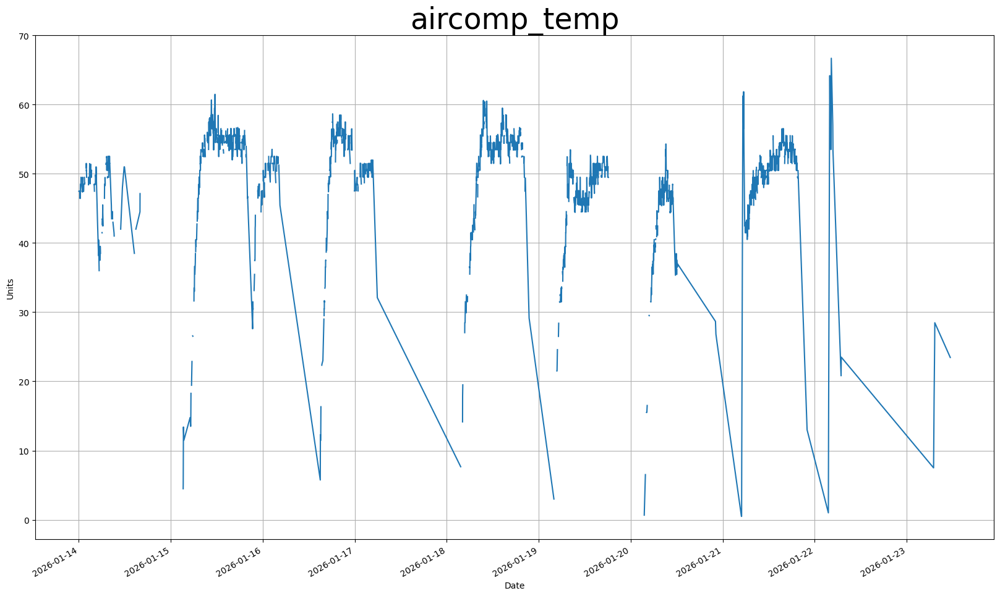

In [27]:
# use only bus states 4 and 5 TEST

df_test = df[(df['sys_phase'] == 4.0) | (df['sys_phase'] == 5.0)].loc['2026-01-14':'2026-01-25']

#df_test = df_test.drop(['sys_phase'], axis=1)

plot_num(df_test, 'aircomp_temp')

# Cap outliers #

# 1. Isolate only the numerical columns
numeric_df = df_test.select_dtypes(include=[np.number])

# 2. Calculate Q1, Q3, and IQR for all columns at once
Q1 = numeric_df.quantile(0.25)
Q3 = numeric_df.quantile(0.75)
IQR = Q3 - Q1

# 3. Define the global lower and upper bounds
lower_bounds = 0 #Q1 - 1.5 * IQR
upper_bounds = Q3 + 1.5 * IQR

# 4. Cap the entire dataframe and update the original
df_test[numeric_df.columns] = numeric_df.clip(lower=lower_bounds, upper=upper_bounds, axis=1)

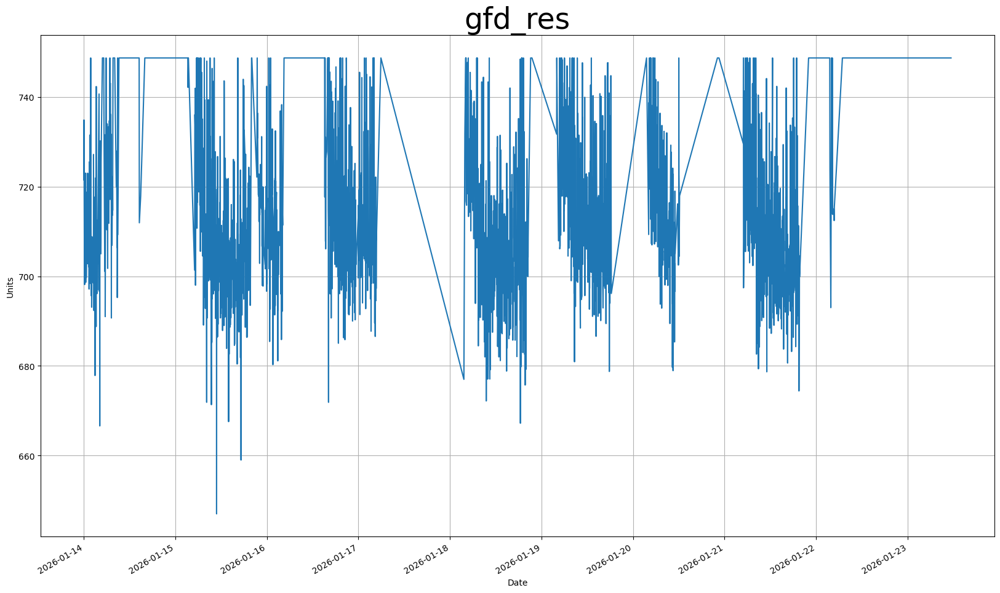

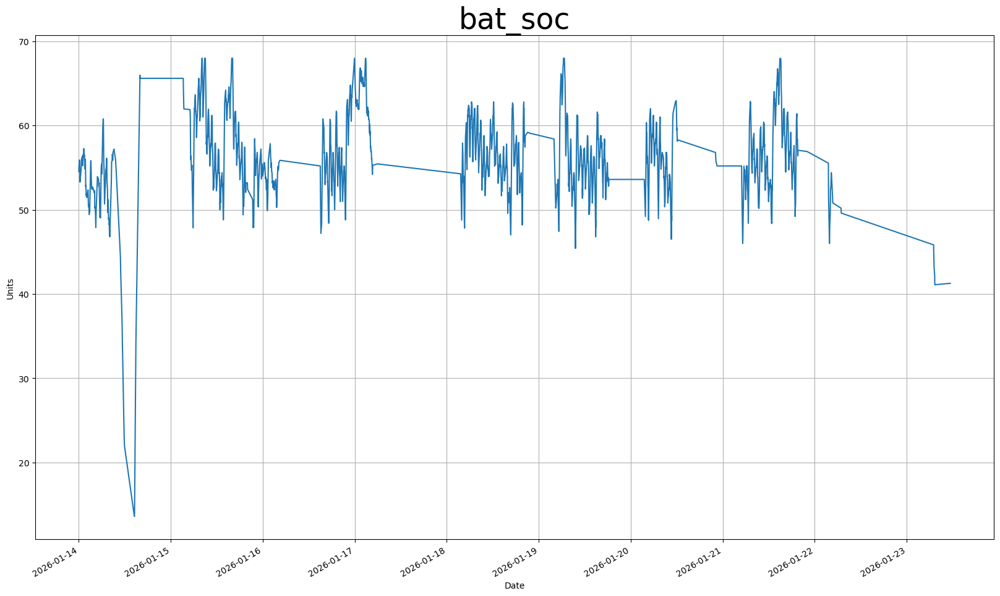

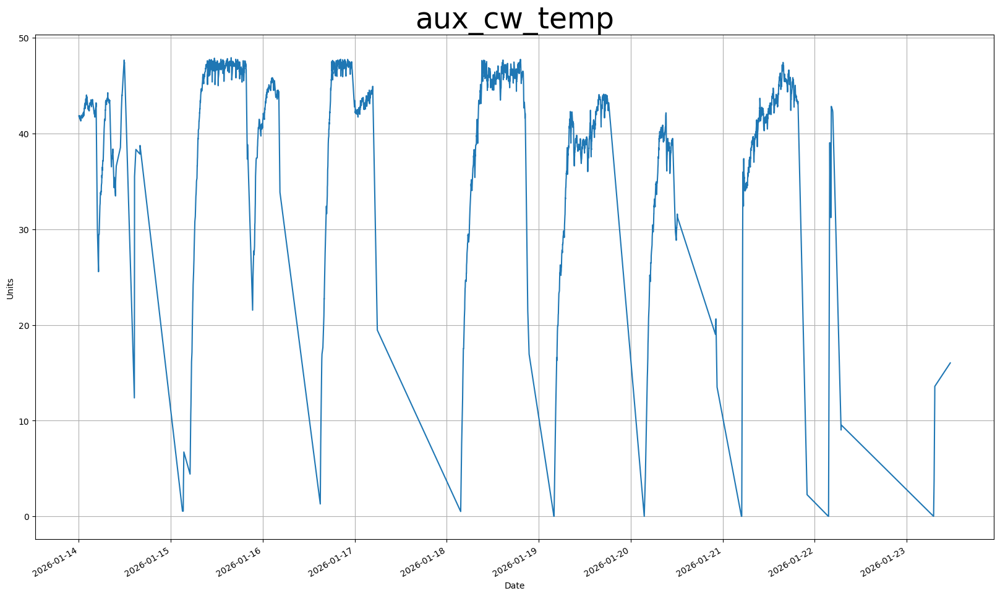

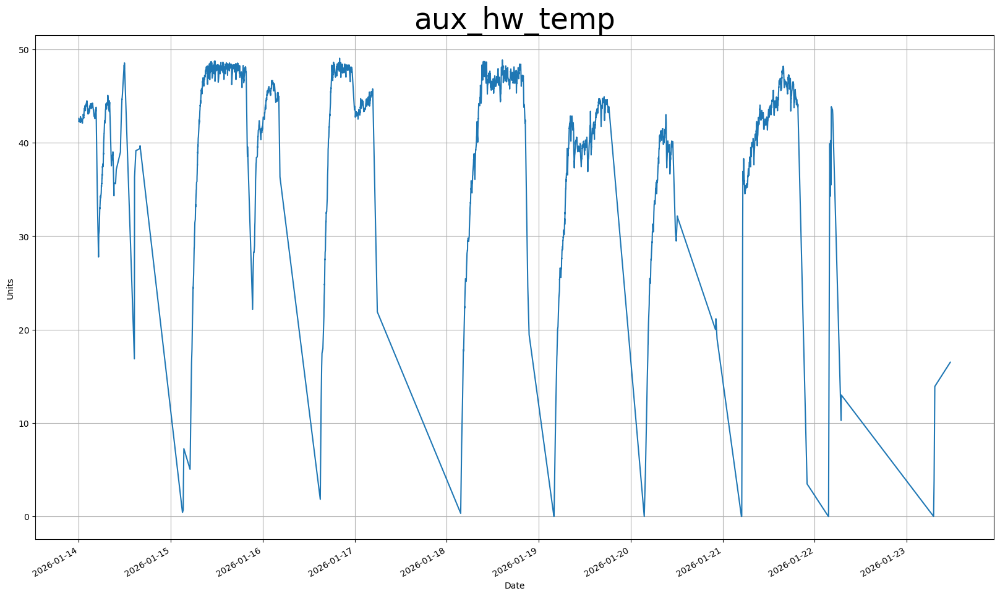

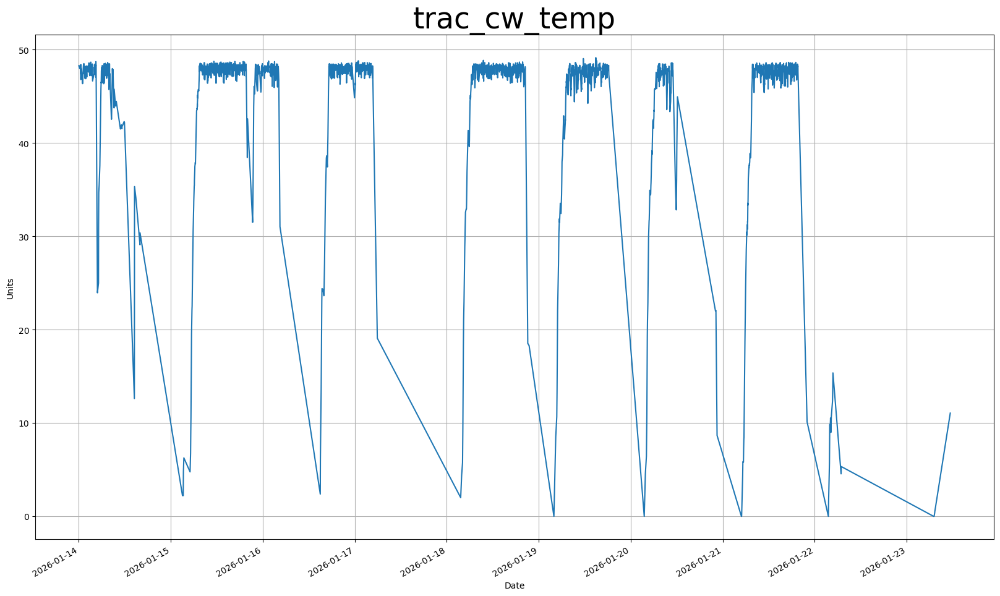

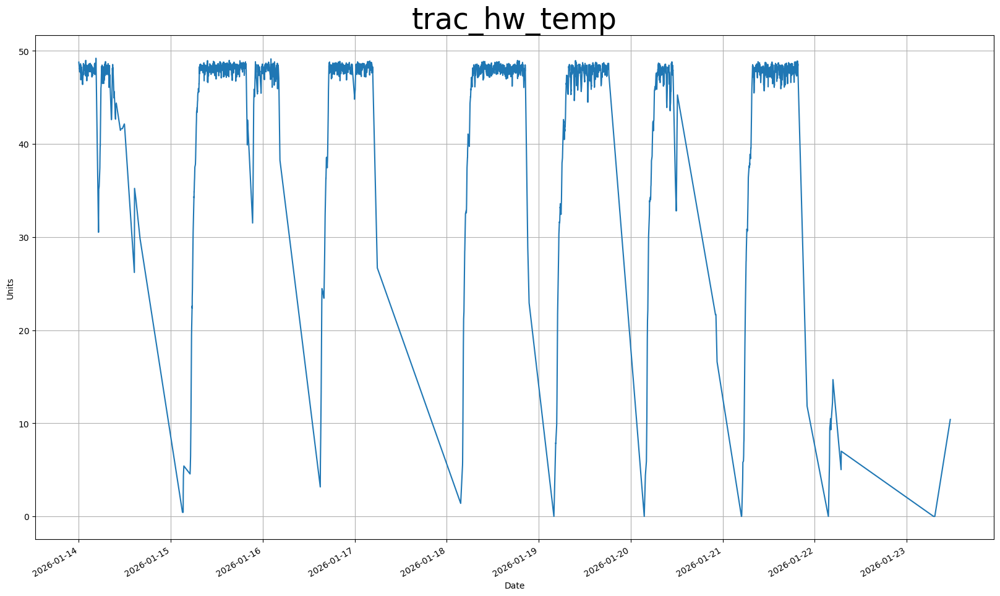

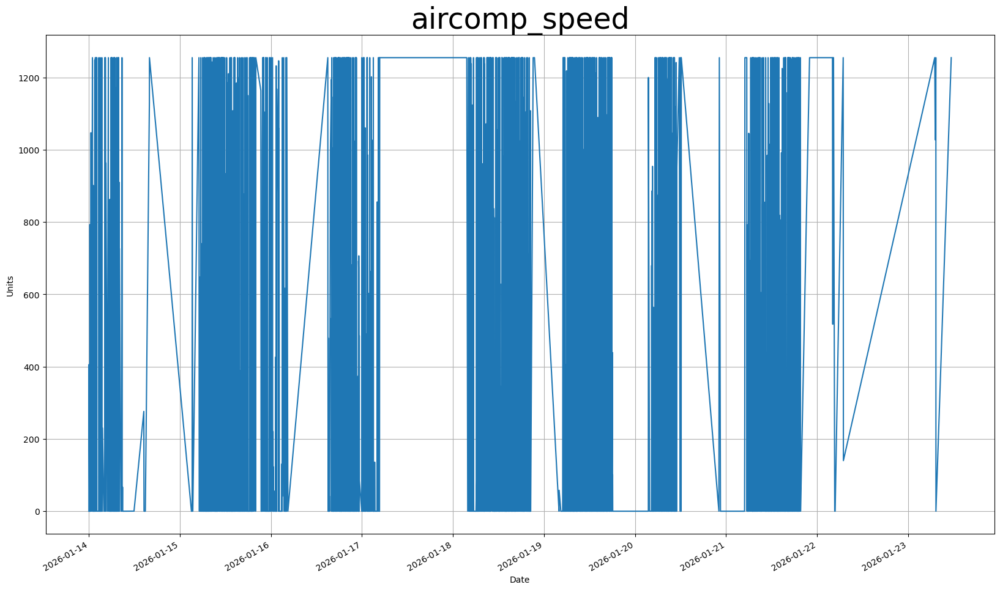

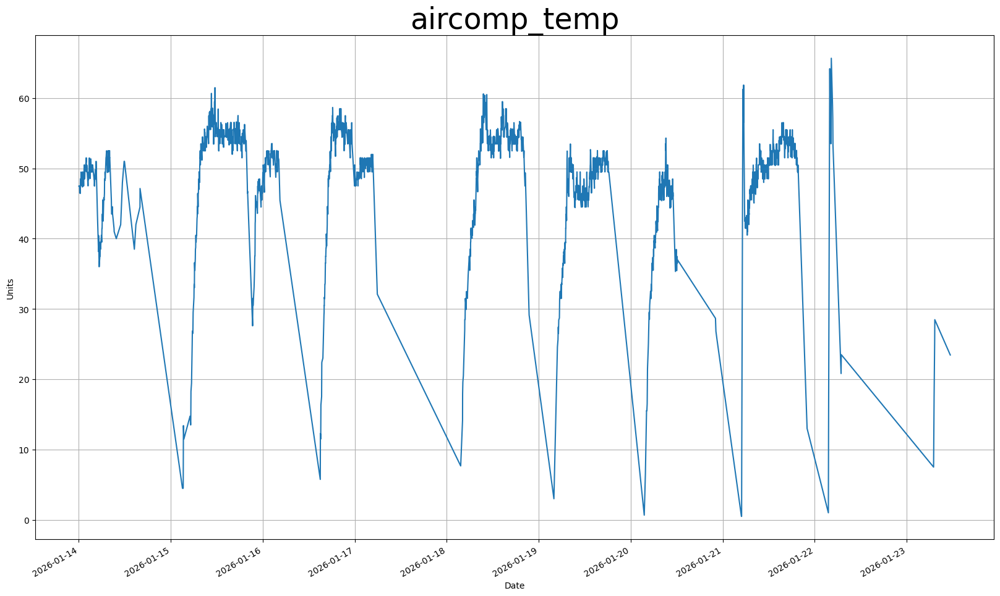

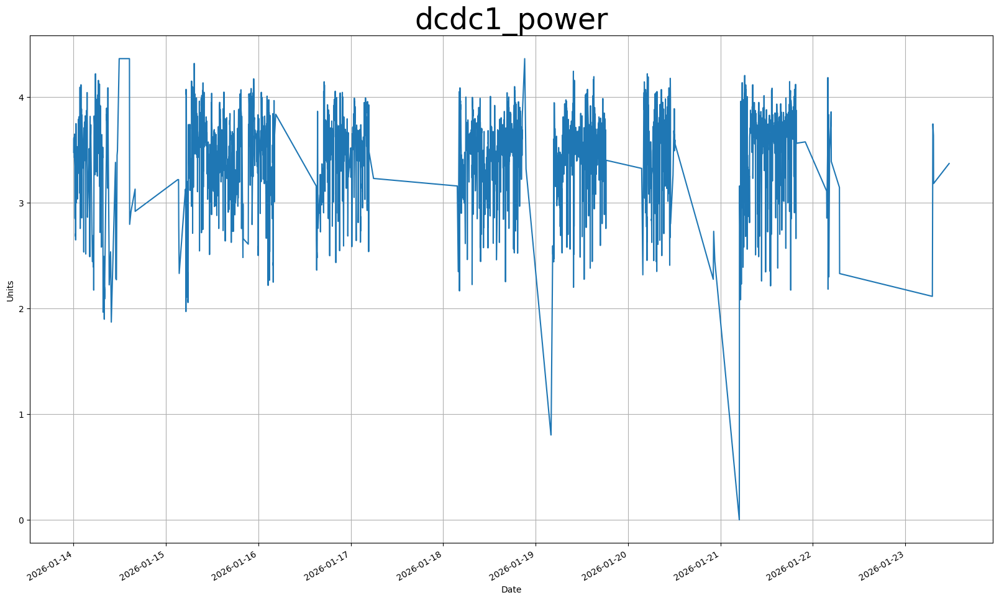

In [28]:
# Imputation

# 1. Ensure the DataFrame is sorted by the DatetimeIndex
df_test = df_test.sort_index()

# 2. Identify numeric and categorical columns
num_cols = df_test.select_dtypes(include='number').columns
cat_cols = df_test.columns.difference(num_cols)

# 3. Identify session boundaries (gap > 6 hours)
time_deltas = df_test.index.to_series().diff()
session_breaks = time_deltas > pd.Timedelta(hours=6)
session_ids = session_breaks.cumsum()

# 4. Define the imputation function applied per session
def impute_session(group):
    # Copy to avoid SettingWithCopy warnings
    group_imputed = group.copy()
    
    # Numerical pipeline: interpolate -> ffill -> bfill
    if len(num_cols) > 0:
        group_imputed[num_cols] = (
            group_imputed[num_cols]
            .interpolate(method='time')
            .ffill()
            .bfill()
        )
    
    # Categorical/Non-numeric pipeline: ffill -> bfill
    if len(cat_cols) > 0:
        group_imputed[cat_cols] = (
            group_imputed[cat_cols]
            .ffill()
            .bfill()
        )
        
    return group_imputed

# 5. Apply per session and restore the original index
df_test = df_test.groupby(session_ids).apply(impute_session).droplevel(0)


for n, feat in enumerate(numerical): plot_num(df_test, feat, n)

df_test.to_parquet('df_test.parquet')

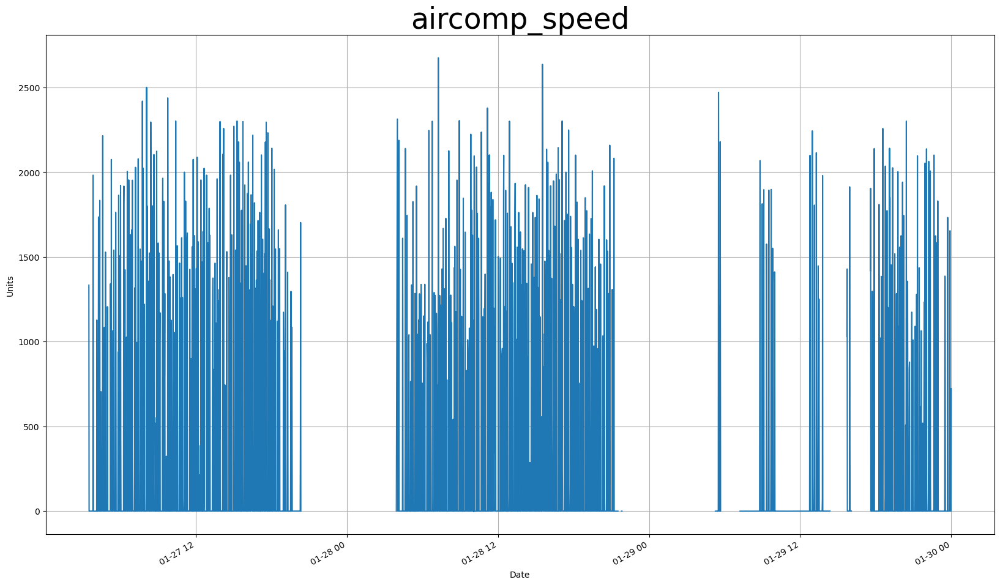

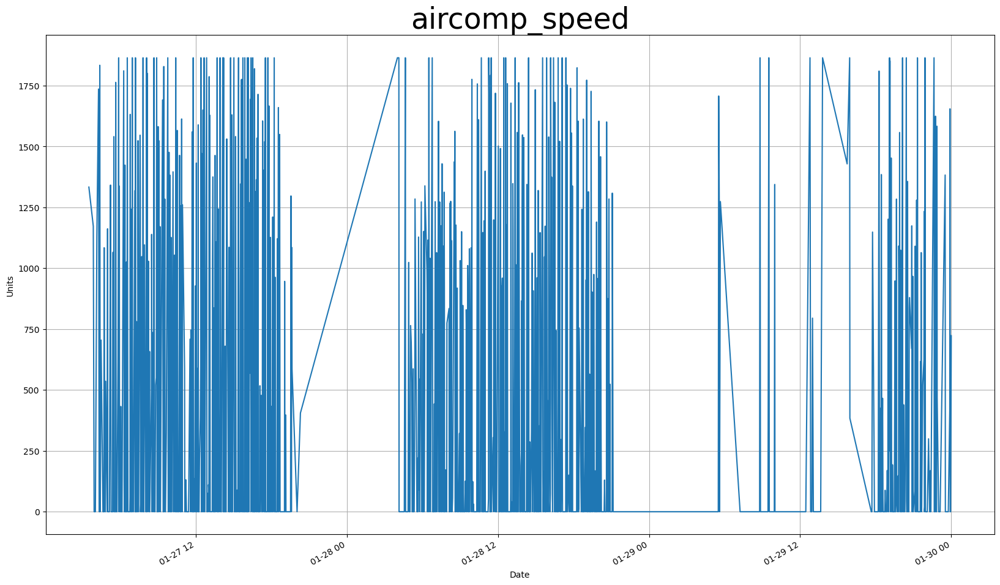

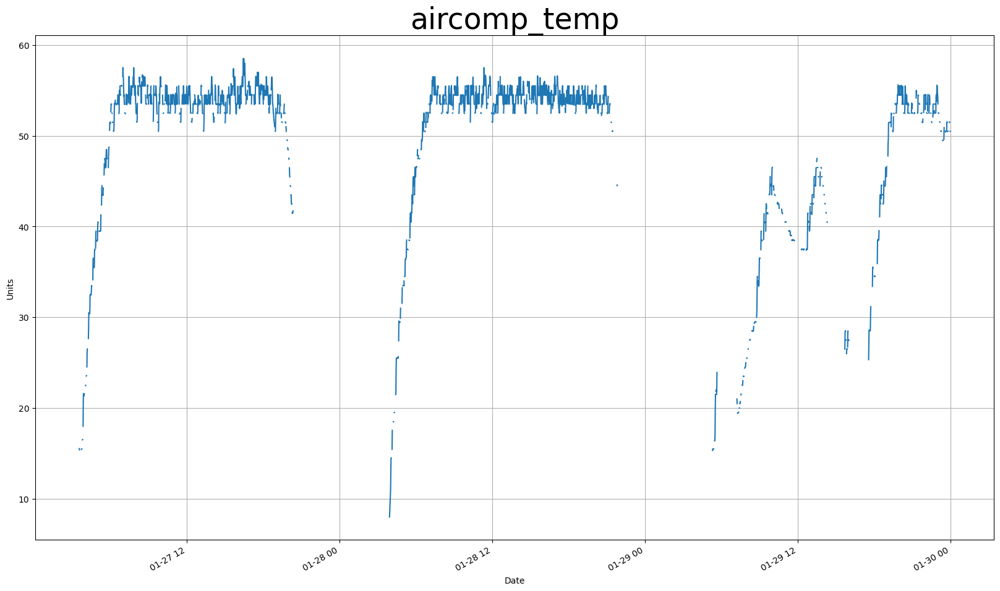

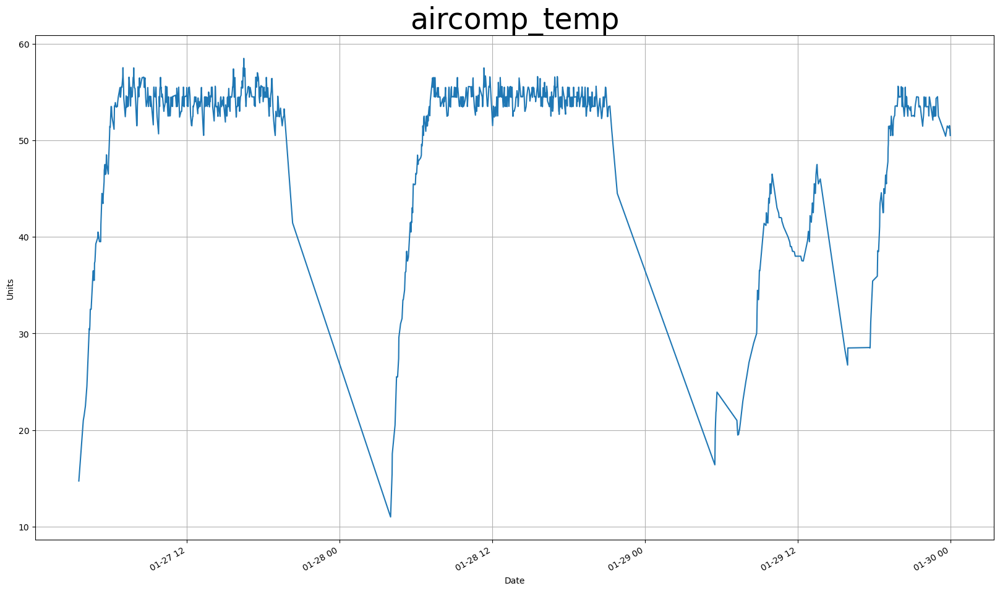

In [29]:
# Plot only a few days #

first_day = '2026-01-27 00:00:00'
last_day = '2026-01-30 00:00:00'

plot_num(df.loc[first_day : last_day], 'aircomp_speed')
plot_num(df_train.loc[first_day : last_day], 'aircomp_speed')

plot_num(df.loc[first_day : last_day], 'aircomp_temp')
plot_num(df_train.loc[first_day : last_day], 'aircomp_temp')